# Finding markers to distinguish progenitors for allantois vs yolk-sac wave (WT)

In [1]:
here::i_am("rna_atac/trajectory/v3/01_trajectory_inference.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))
suppressPackageStartupMessages(library(destiny))
suppressPackageStartupMessages(library(tradeSeq))
suppressPackageStartupMessages(library(slingshot))
suppressPackageStartupMessages(library(ArchR))
suppressPackageStartupMessages(library(BiocParallel))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 8

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM
set.seed(42)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”

                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | 

In [2]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/trajectory/v3')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [3]:
# Load meta
meta = fread(args$metadata)[day %in% c('D3', 'D3.5', 'D4', 'D4.5', 'D5')] %>% 
    .[celltype_v2 %in% c('Primitive_Streak', 'Early_Mes_EOi','Early_Mes_EOd','Posterior_Mes','HE_Precursor', 'HE', 'Allantois_Precursor')]

#### Load Data

In [4]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = F, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()
rna.sce = logNormCounts(rna.sce)

# Trajectory Inference on MOFA factors

In [28]:
# Prepare mofa umap
umap.mtx = meta[,c('cell', 'UMAP1', 'UMAP2')] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

In [29]:
mofa = fread(file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')) %>% 
    .[match(colnames(rna.sce), cell),] %>% 
    as.data.frame() %>% tibble::column_to_rownames('cell') %>% 
    as.matrix

pca = fread(file.path(io$basedir, 'results/rna/dimensionality_reduction/sce/none/pca_features1500_pcs15.txt.gz')) %>% 
    .[match(colnames(rna.sce), cell),] %>% 
    as.data.frame() %>% tibble::column_to_rownames('cell') %>% 
    as.matrix

In [30]:
# Add RNA PCA 
reducedDims(rna.sce)$pca = pca
# Add mofa factors
reducedDims(rna.sce)$mofa = mofa[,1:10]
# Add mofa umap
reducedDims(rna.sce)$mofa_umap = umap.mtx[match(colnames(rna.sce), rownames(umap.mtx)),]

# dm <- DiffusionMap(mofa, n_pcs=ncol(mofa))
# # Add to the SingleCellExperiment object
# reducedDim(rna.sce, "DiffusionMap") <- dm@eigenvectors[,c(1:3)] * 1000

Warning message:
“as(<dsCMatrix>, "dsTMatrix") is deprecated since Matrix 1.5-0; do as(., "TsparseMatrix") instead”


In [32]:
set.seed(42)
rna.sce <- slingshot(rna.sce, 
                     clusterLabels = 'celltype_v2', 
                     start.clus = 'Primitive_Streak', 
                   #  end.clus = c('Allantois_Precursor', 'HE'),
                    # extend = 'n',
                     shrink = TRUE,
                     reducedDim='mofa')

In [38]:
saveRDS(rna.sce$slingshot, file.path(args$outdir, 'slingshot.rds'))

In [39]:
saveRDS(rna.sce, file.path(args$outdir, 'rna_sce.rds'))

In [5]:
rna.sce = readRDS(file.path(args$outdir, 'rna_sce.rds'))

In [6]:
# Assign cells to lineage, doing this now to make sure it's consistent
# Notice, assignCells is not fixed in which cells are assigned which lineage, even after setting a seed!
set.seed(42)
assign_lineages = tradeSeq:::.assignCells(assays(rna.sce$slingshot)$weights)
#colnames(assign_lineages) = c('Trajectory1', 'Trajectory2')
pseudotime = slingPseudotime(rna.sce$slingshot, na=T)

Traj_assignment = as.data.table(assign_lineages, keep.rownames=T) %>%
    setnames(c('cell', paste0('Trajectory', 1:(length(.)-1))))

Traj1 = as.data.table(pseudotime[,1], keep.rownames=T) %>% 
    .[V1 %in% Traj_assignment[Trajectory1 == 1, cell]] #%>% 
   # .[V2>5 & V2<10]

Traj2 = as.data.table(pseudotime[,2], keep.rownames=T) %>% 
    .[V1 %in% Traj_assignment[Trajectory2 == 1, cell]] #%>% 
    #.[V2>5 & V2<10]

In [8]:
# Combine & add which trajectory
Traj_full = rbind(Traj1[,Traj:='Trajectory1'], Traj2[,Traj:='Trajectory2']) %>%
    setnames(c('cell', 'pseudotime', 'Traj'))

In [9]:
meta2 = rbind(meta[cell %in% Traj_assignment[Trajectory1==1, cell]] %>% 
                  .[, trajectory := 'Traj1'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_1],
              meta[cell %in% Traj_assignment[Trajectory2==1, cell]] %>%
                  .[, trajectory := 'Traj2'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_2])

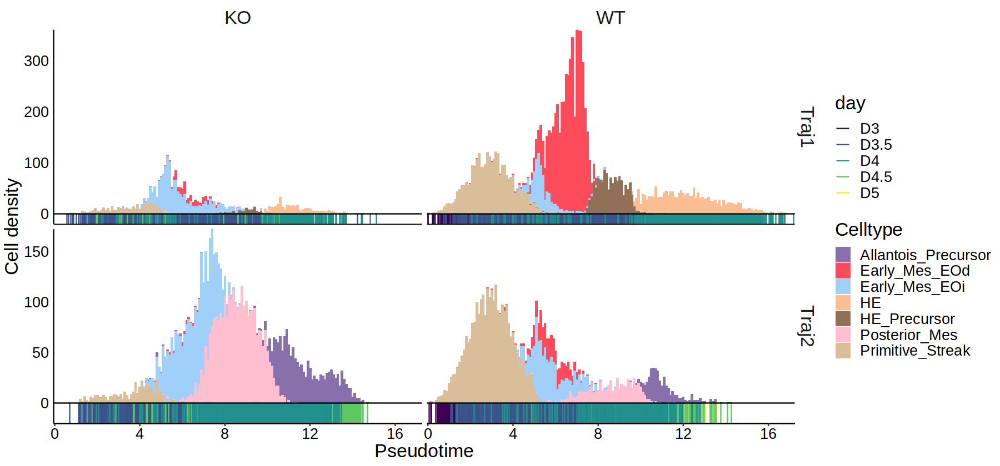

In [8]:
options(repr.plot.width = 15, repr.plot.height=7)
ggplot(meta2, aes(pseudotime, fill=celltype_v1)) + 
    geom_histogram(binwidth=0.1, position='stack') + 
    scale_colour_manual(values = opts$days.colors, name='day') + 
    scale_fill_manual(values = opts$celltype_v2.colors, name='Celltype') +
    geom_segment(aes(x = pseudotime, xend = pseudotime, y = 0, yend = -20, col=day)) + 
    scale_x_continuous(expand=c(0,0)) + 
    scale_y_continuous(expand=c(0,0)) + 
    geom_hline(yintercept=0, color='black') +
    geom_hline(yintercept=-20, color='black') +
    # geom_vline(xintercept = 13, color='red') + 
    # geom_vline(xintercept = 2, color='red') + 
    xlab('Pseudotime') + ylab('Cell density') + 
    facet_grid(rows = vars(trajectory), cols = vars(genotype),scales='free_y') + 
    theme_classic() + 
    theme(text = element_text(size=20),
          axis.text = element_text(color='black'),
       #   axis.text.y = element_blank(),
          axis.ticks.y = element_blank(),
          strip.background = element_blank(),
          strip.text = element_text(size=20),
          legend.position='right')

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Removed 2 rows containing missing values (`position_stack()`).”


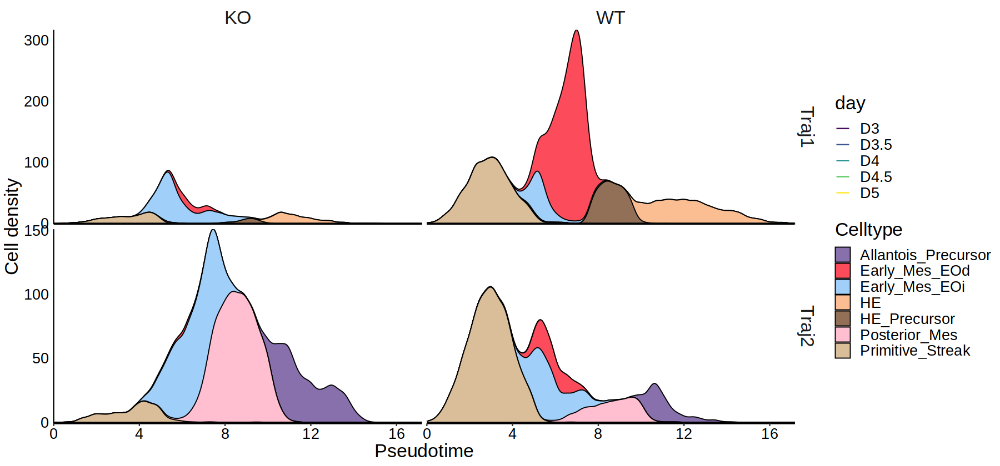

In [54]:
options(repr.plot.width = 15, repr.plot.height=7)
ggplot(meta2, aes(pseudotime, fill=celltype_v1)) + 
    # geom_histogram(binwidth=0.1, position='stack') + 
    geom_density(aes(y = after_stat(density * n/10)), position = 'stack', color = 'black', linewidth = 0.4, bw = 0.2) + 
    scale_colour_manual(values = opts$days.colors, name='day') + 
    scale_fill_manual(values = opts$celltype_v2.colors, name='Celltype') +
    geom_segment(aes(x = pseudotime, xend = pseudotime, y = 0, yend = -1, col=day)) + 
    scale_x_continuous(expand=c(0,0)) + 
    scale_y_continuous(expand=c(0,0)) + 
    geom_hline(yintercept=0, color='black') +
    geom_hline(yintercept=-1, color='black') +
    # geom_vline(xintercept = 13, color='red') + 
    # geom_vline(xintercept = 2, color='red') + 
    xlab('Pseudotime') + ylab('Cell density') + 
    facet_grid(rows = vars(trajectory), cols = vars(genotype),scales='free_y') + 
    theme_classic() + 
    theme(text = element_text(size=20),
          axis.text = element_text(color='black'),
       #   axis.text.y = element_blank(),
          axis.ticks.y = element_blank(),
          strip.background = element_blank(),
          strip.text = element_text(size=20),
          legend.position='right')

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Removed 1 rows containing missing values (`position_stack()`).”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Removed 1 rows containing missing values (`position_stack()`).”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Removed 1 rows containing missing values (`position_stack()`).”


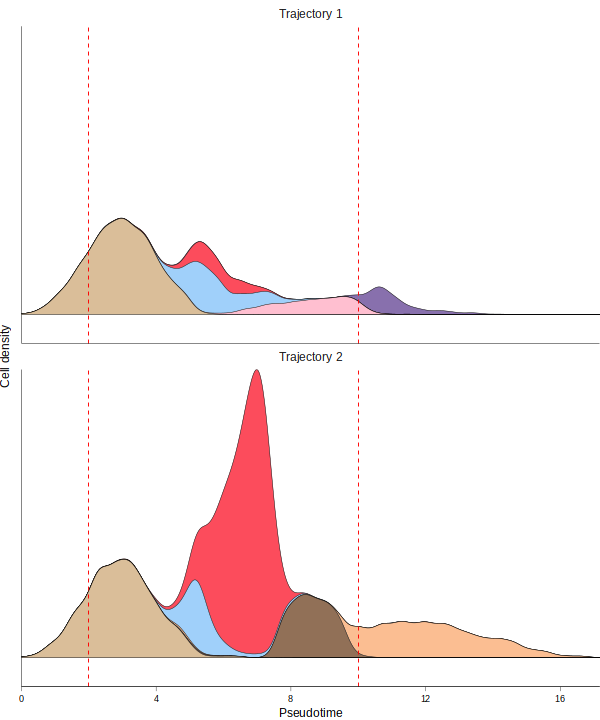

In [55]:
# facet_labels = c()
p1 = ggplot(meta2[genotype=='WT'][,trajectory := factor(trajectory, levels = c('Traj2', 'Traj1'))], aes(pseudotime, fill=celltype_v1)) + 
    # geom_histogram(binwidth=0.1, position='stack') + 
    geom_density(aes(y = after_stat(density * n/10)), position = 'stack', color = 'black', linewidth = 0.1, bw = 0.2) + 
    scale_colour_manual(values = opts$days.colors, name='day') + 
    scale_fill_manual(values = opts$celltype_v2.colors, name='Celltype') +
    scale_x_continuous(expand=c(0,0)) + 
    scale_y_continuous(expand=c(0,0)) + 
    geom_vline(xintercept = c(2, 10), color='red', linetype = 'dashed', linewidth = 0.2) + 
    xlab('Pseudotime') + ylab('Cell density') + 
    facet_wrap(~trajectory, ncol = 1, 
               scales='fixed', 
               labeller = labeller(trajectory = c('Traj1' = 'Trajectory 2', 'Traj2' = 'Trajectory 1'))) + # Silly thing but we ended up switching the labels around
    theme_classic() + 
    theme(text = element_text(size=6),
          axis.text = element_text(color='black'),
          axis.title = element_text(size = 7),
          axis.text.y = element_blank(),
          axis.ticks.y = element_blank(),
          axis.line = element_line(linewidth = 0.1),
          axis.ticks=element_line(linewidth=0.1),
          strip.background = element_blank(),
          strip.text = element_text(size=7),
          panel.spacing = unit(0, "lines"),
          plot.margin = unit(c(0, 0, 0, 0), "mm"),
          legend.position='none')

p1_values = ggplot_build(p1)
p1 = p1 +    
    geom_segment(aes(x = pseudotime, xend = pseudotime, y = 0, yend = -max(p1_values$data[[1]]$ymax)/10, col=day), linewidth = 0.001) + 
    geom_hline(yintercept=c(0,-max(p1_values$data[[1]]$ymax)/10), linewidth = 0.1, color='black')

options(repr.plot.width = 5, repr.plot.height=6)
p1

ggsave(file.path(io$basedir, 'figures/multiome_trajectory_density.pdf'), 
       plot = p1,
       width = 30, 
       height = 55, 
       units = "mm")

In [65]:
# Define custom color palettes with smooth transition around 0.5
palette1 <- colorRampPalette(c("darkblue", "orange", "chartreuse", 'chartreuse4'))(100) # YS trajectory palette
palette2 <- colorRampPalette(c("darkblue", "orange", "orchid1", 'darkorchid4'))(100)  # Alnt trajectory palette

all_cells = fread(args$metadata)[genotype == 'WT']

p1_umap = ggplot(all_cells[], aes(UMAP1, UMAP2)) +
    #ggrastr::rasterise(geom_point(size = -0.10, color='black'), dpi = 600) + 
    ggrastr::rasterise(geom_point(size = -0.3, color='grey90'), dpi = 600) + 
    ggrastr::rasterise(geom_point(data = meta2[trajectory == 'Traj1' & genotype == 'WT'], aes(color=pseudotime), size = -0.3), dpi = 900) +
    scale_color_gradientn(colors = palette1, name = 'Pseudotime',
                          breaks = c(0, 5, 10, 15),
                       guide = guide_colorbar(
                            barwidth = 2, barheight = 0.5,
                            frame.colour = "black",
                            ticks.colour = 'black')) +  # Apply custom palette 1
    scale_x_continuous(expand=c(0.01,0.01)) + 
    scale_y_continuous(expand=c(0.01,0.01)) + 
    coord_fixed() + 
    theme_void() + 
    theme(legend.position = c(0.77,0.10),
          legend.direction = 'horizontal',
          legend.title = element_text(size = 6), #element_text(vjust = 1, size = 25),
          legend.text = element_text(vjust = 2, size = 6))

p2_umap = ggplot(all_cells[], aes(UMAP1, UMAP2)) +
    #ggrastr::rasterise(geom_point(size = -0.10, color='black'), dpi = 600) + 
    ggrastr::rasterise(geom_point(size = -0.3, color='grey90'), dpi = 600) + 
    ggrastr::rasterise(geom_point(data = meta2[trajectory == 'Traj2' & genotype == 'WT'], aes(color=pseudotime), size = -0.3), dpi = 900) +
    scale_color_gradientn(colors = palette2, name = 'Pseudotime',
                          breaks = c(0, 5, 10),
                          labels = c(0, 5, 10),
                       guide = guide_colorbar(
                            barwidth = 2, barheight = 0.5,
                            frame.colour = "black",
                            ticks.colour = 'black')) +  # Apply custom palette 1
    scale_x_continuous(expand=c(0.01,0.01)) + 
    scale_y_continuous(expand=c(0.01,0.01)) + 
    coord_fixed() + 
    theme_void() + 
    theme(legend.position = c(0.77,0.10),
          legend.direction = 'horizontal',
          legend.title = element_text(size = 6), #element_text(vjust = 1, size = 25),
          legend.text = element_text(vjust = 2, size = 6))

width = 5
options(repr.plot.width=width, repr.plot.height=width*6/7.5)
#ggarrange(p2_umap, p1_umap, ncol = 1)

ggsave(file.path(io$basedir, 'figures/multiome_trajectory_umap.pdf'), 
       plot = ggarrange(p2_umap, NULL, p1_umap, ncol = 1, heights = c(1, -0.05, 1)),
       width = 30, 
       height = 55, 
       units = "mm")

In [66]:
#ggarrange(p1, ggarrange(p2_umap, p1_umap, ncol = 1))
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_combined.pdf'), 
       plot = ggarrange(p1, ggarrange(NULL, p2_umap, p1_umap, NULL, heights = c(0.2, 1, 1, 0.2), ncol = 1)),
       width = 69, 
       height = 41, 
       units = "mm")

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Removed 1 rows containing missing values (`position_stack()`).”


In [427]:
rna.sce = logNormCounts(rna.sce)

In [25]:
# Keep only cells within pseudotime window for analysis
tmp = Traj_assignment
tmp2 = as.data.table(pseudotime, keep.rownames=T)
pseudo_min = 2
pseudo_max = 10

lineage1_keep = tmp2[rn %in% tmp[Trajectory1==1, cell]] %>% .[Lineage1 >= pseudo_min & Lineage1 <= pseudo_max] %>% .$rn
lineage2_keep = tmp2[rn %in% tmp[Trajectory2==1, cell]] %>% .[Lineage2 >= pseudo_min & Lineage2 <= pseudo_max] %>% .$rn

within_pseudotime_cells = c(lineage1_keep, lineage2_keep)

In [26]:
# Only running on WT first
within_pseudotime_cells = intersect(within_pseudotime_cells, meta[genotype=='WT', cell])

# RNA - Differential expression along trajectory

In [27]:
## Filter genes
#By minimum expression level
# expression = data.table(gene = rownames(rna.sce),
#                   max_expr = rowMaxs(logcounts(rna.sce))) %>% 
#             .[max_expr >= 2]

# By variance
args$features = 1e4 # get top 10k variable genes
decomp <- modelGeneVar(rna.sce[,within_pseudotime_cells], block=rna.sce[,within_pseudotime_cells]$sample) # [expression$gene,]
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>%  # Next try ordering by logFC instead of FDR
    as.data.table(., keep.rownames=T) %>% 
     head(n=args$features) %>% .$rn


Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [28]:
U <- model.matrix(~rna.sce[, within_pseudotime_cells]$replicate)

In [31]:
summary(rownames(slingPseudotime(rna.sce$slingshot, na=F)[within_pseudotime_cells,]) ==
       rownames(assign_lineages[within_pseudotime_cells,]),
       colnames(counts(rna.sce[, within_pseudotime_cells])))

   Mode    TRUE 
logical   13786 

In [32]:
BPPARAM$workers = 1
sceGAM <- fitGAM(counts = counts(rna.sce[, within_pseudotime_cells]),
              #   sds = rna.sce$slingshot,
                 pseudotime = slingPseudotime(rna.sce$slingshot, na=F)[within_pseudotime_cells,],
                 #cellWeights = pathStats(rna.sce$slingshot)$weights[within_pseudotime_cells,],
                 cellWeights = assign_lineages[within_pseudotime_cells,],
                 U = U, # Don't use replicates for test
                 nknots=8, 
                 genes = hvgs,
                 parallel = T,
                 BPPARAM=BPPARAM,
                 verbose=T)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.3 GiB”


  |======================================================================| 100%



In [36]:
saveRDS(sceGAM, file.path(args$outdir, 'sceGAM.rds'))

In [10]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM.rds'))

In [ ]:
patternRes <- patternTest(sceGAM, l2fc=1) # Perform pattern testing with set l2fc
patternGenes = patternRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(patternGenes[sig==TRUE])

In [ ]:
endRes <- diffEndTest(sceGAM, l2fc=1) # Perform pattern testing with set l2fc
endGenes = endRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(endGenes[sig==TRUE])

In [ ]:
fwrite(patternGenes, file.path(args$outdir, 'patternGenes.txt.gz'))
fwrite(endGenes, file.path(args$outdir, 'endGenes.txt.gz'))

In [11]:
patternGenes = fread(file.path(args$outdir, 'patternGenes.txt.gz'))
endGenes = fread(file.path(args$outdir, 'endGenes.txt.gz'))

In [12]:
genes_keep = unique(rbind(patternGenes[,c('gene', 'waldStat', 'padj', 'sig')], endGenes[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)

In [13]:
suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(ComplexHeatmap))

# Get smoothed expession
yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

# Separate YS and Allantois trajectories
YS = yhatSmooth_minmax[, grepl('lineage1', colnames(yhatSmooth_minmax))] # again trajectory names are switched
Alnt = yhatSmooth_minmax[, grepl('lineage2', colnames(yhatSmooth_minmax))]

In [14]:
# Clustering of genes & re-annotating in order of expression
set.seed(42)
k = 10
group = kmeans(yhatSmooth_minmax, centers = k)$cluster

group_rename = c(
    '3' = '1',
    '7' = '2', 
    '9' = '3', 
    '10' = '4',                
    '2' = '5',
    '6' = '6', 
    '4' = '7',
    '8' = '8', 
    '1' = '9', 
    '5' = '10'
)

tmp = group
group = as.integer(group_rename[match(group, names(group_rename))])
names(group) = names(tmp)
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)


In [15]:
pseudo_min = 2
pseudo_max = 10

## Values color palette
trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')
cols <- trans(seq(0,1, length.out=20))

## Create a top annotation for the clusters

palette1 <- colorRampPalette(c("darkblue", "orange", "chartreuse", 'chartreuse4')) # YS trajectory palette
palette2 <- colorRampPalette(c("darkblue", "orange", "orchid1", 'darkorchid4'))  # Alnt trajectory palette

# Allantois heatmap annotation
ii <- cut(seq(pseudo_min, pseudo_max, len = 100), breaks = seq(0, max(meta2[trajectory == 'Traj2', pseudotime]), len = 100), 
          include.lowest = TRUE)
colors <- palette2(99)[ii]
ha_alnt <- HeatmapAnnotation(
                          pseudotime = 1:100,
                          col = list(pseudotime = colorRamp2(1:100, colors)),
                          show_legend = FALSE,
                          show_annotation_name = FALSE,
                          simple_anno_size   = unit(2, "mm")  # Adjust the height as needed, for example unit(2, "cm")
)

# YS heatmap annotation
ii <- cut(seq(pseudo_min, pseudo_max, len = 100), breaks = seq(0, max(meta2[trajectory == 'Traj1', pseudotime]), len = 100), 
          include.lowest = TRUE)
colors <- palette1(99)[ii]
ha_ys = HeatmapAnnotation(pseudotime = 1:100,
                            col = list(pseudotime = colorRamp2(1:100, colors)),
                            show_legend = FALSE,
                            show_annotation_name  = FALSE,
                            simple_anno_size   = unit(2, "mm"),  # Adjust the height as needed, for example unit(2, "cm")
                            annotation_name_gp= gpar(fontsize = 7)
)


## Create row annotation for the clusters
# Assign colors to each cluster
cluster_colors <- viridis::viridis(k)
names(cluster_colors) <- as.character(1:k)

# Create a color function for the clusters
cluster_col_fun <- function(cluster) cluster_colors[as.character(cluster)]
ha_row <- rowAnnotation(
  cluster = anno_simple(group, col = cluster_colors, width = unit(1, "mm"), height = unit(1, "mm")),
                       show_legend = FALSE,
                       show_annotation_name = FALSE
)

png 
  2

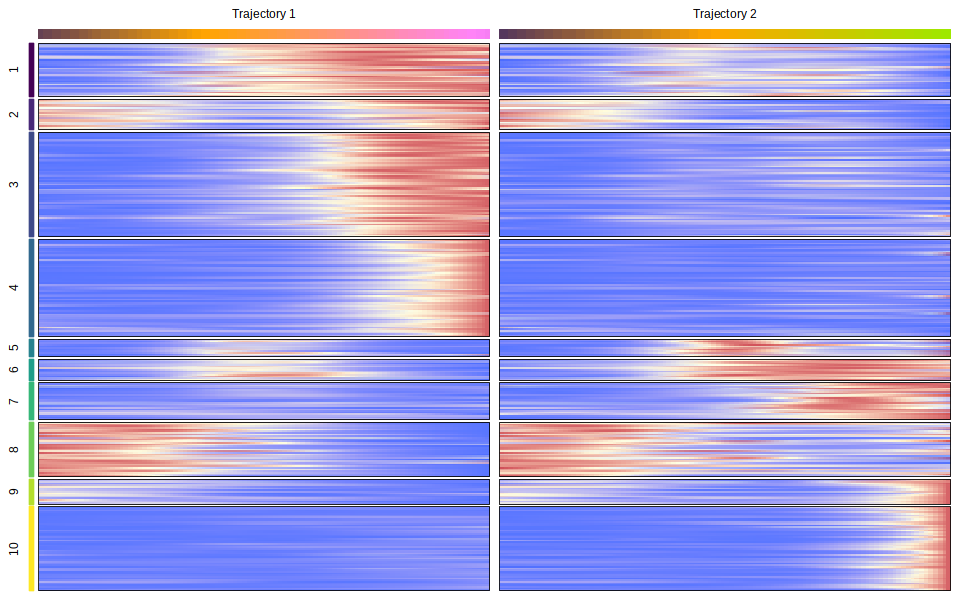

In [16]:
# # Clustering

# hm_list = Heatmap(Alnt, 
#             row_gap = unit(0.5, "mm"),
#             cluster_columns = FALSE,
#             column_title = 'Trajectory 1',
#             show_column_names  = FALSE,
#             show_row_names  = FALSE,
#             col = cols,
#             show_heatmap_legend = FALSE,
#             row_split = group, 
#             left_annotation = ha_row,
#             show_row_dend = FALSE,
#             row_order = order(group, decreasing = TRUE),
#             # heatmap_legend_param = list(title = 'Expression'), 
#             row_title_gp = gpar(fontsize = 7),
#             column_title_gp = gpar(fontsize = 7),
#             top_annotation = ha_alnt,
#             border = TRUE,
#             border_gp = gpar(col = "black", lwd = 0.5),
#             use_raster = TRUE,
#             raster_device = "png",
#             raster_quality = 1) + 
#           Heatmap(YS, 
#             row_gap = unit(0.5, "mm"),
#             cluster_columns = FALSE,
#             column_title = 'Trajectory 2',
#             show_column_names  = FALSE,
#             show_row_names  = FALSE,
#             col = cols,
#             show_heatmap_legend = FALSE,
#             row_split = group, 
#             left_annotation = NULL,
#             show_row_dend = FALSE,
#             row_order = order(group, decreasing = TRUE),
#             column_title_gp = gpar(fontsize = 7),
#             top_annotation = ha_ys,
#             border = TRUE,
#             border_gp = gpar(col = "black", lwd = 0.5),
#             use_raster = TRUE,
#             raster_device = "png",
#             raster_quality = 1)

# options(repr.plot.height=5, repr.plot.width=8)
# draw(hm_list)

# pdf(file = file.path(io$basedir, 'figures/multiome_trajectory_RNA_heatmap.pdf'),
#    height = 2.3, 
#    width = 1.7)
#     draw(hm_list)
# dev.off()

In [17]:
# Specify which rows to annotate
rows_to_annotate <- c('Eomes', 'Lhx1', 'Nfatc1', 'Etv2', 'Sox7', 'Tal1',
          'Snai2', 'Hand1', 'Hoxa10',  'Smad3','Sox6', 'Tbx4'
                     )
row_indices <- which(rownames(YS) %in% rows_to_annotate)
row_anno = rowAnnotation(link = anno_mark(at = row_indices, 
        labels = rownames(YS)[row_indices], 
        labels_gp = gpar(fontsize = 10), padding = unit(1, "mm")))

png 
  2

png 
  2

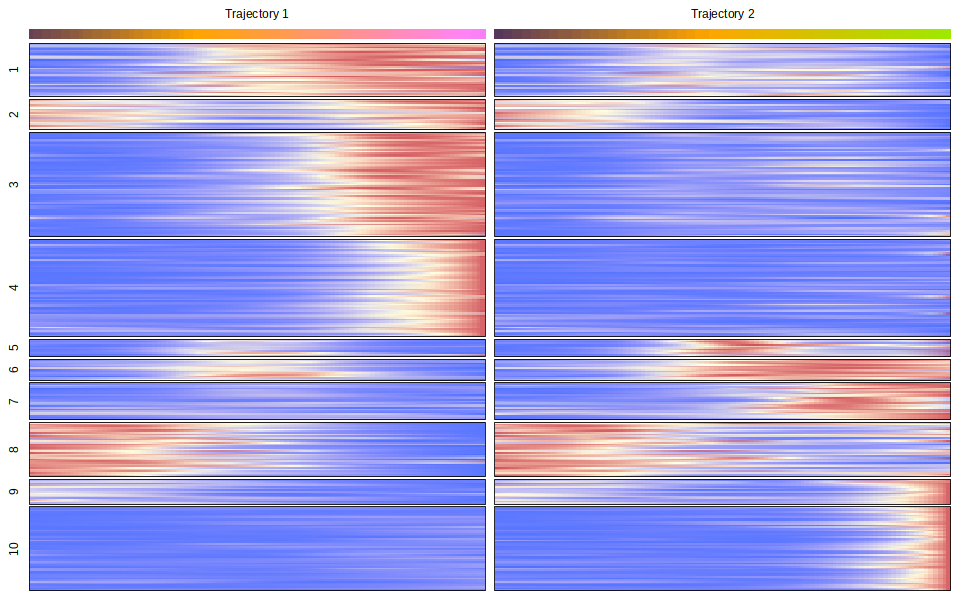

In [18]:
# Clustering

hm_list = Heatmap(Alnt, 
           row_gap = unit(0.5, "mm"),
            cluster_columns = FALSE,
            column_title = 'Trajectory 1',
            show_column_names  = FALSE,
            show_row_names  = FALSE,
            col = cols,
            show_heatmap_legend = FALSE,
            row_split = group, 
           # left_annotation = ha_row,
            show_row_dend = FALSE,
            row_order = order(group, decreasing = TRUE),
            # heatmap_legend_param = list(title = 'Expression'), 
            row_title_gp = gpar(fontsize = 7),
            column_title_gp = gpar(fontsize = 7),
            top_annotation = ha_alnt,
            border = TRUE,
            border_gp = gpar(col = "black", lwd = 0.5),
            use_raster = TRUE,
            raster_device = "png",
            raster_quality = 1) + 
          Heatmap(YS, 
           row_gap = unit(0.5, "mm"),
            cluster_columns = FALSE,
            column_title = 'Trajectory 2',
            show_column_names  = FALSE,
            show_row_names  = FALSE,
            col = cols,
            show_heatmap_legend = FALSE,
            row_split = group, 
            left_annotation = NULL,
            show_row_dend = FALSE,
            row_order = order(group, decreasing = TRUE),
            column_title_gp = gpar(fontsize = 7),
            top_annotation = ha_ys,
            border = TRUE,
            border_gp = gpar(col = "black", lwd = 0.5),
            use_raster = TRUE,
            raster_device = "png",
            raster_quality = 1
                 )

options(repr.plot.height=5, repr.plot.width=8)
plot = draw(hm_list)

pdf(file = file.path(io$basedir, 'figures/multiome_trajectory_RNA_heatmap.pdf'),
   height = 2.3, 
   width = 1.7)
    draw(hm_list)
dev.off()

pdf(file = file.path(io$basedir, 'figures/multiome_trajectory_RNA_heatmap_correct_rowanno.pdf'),
   height = 5, 
   width = 1.7)
    draw(hm_list + row_anno)
dev.off()

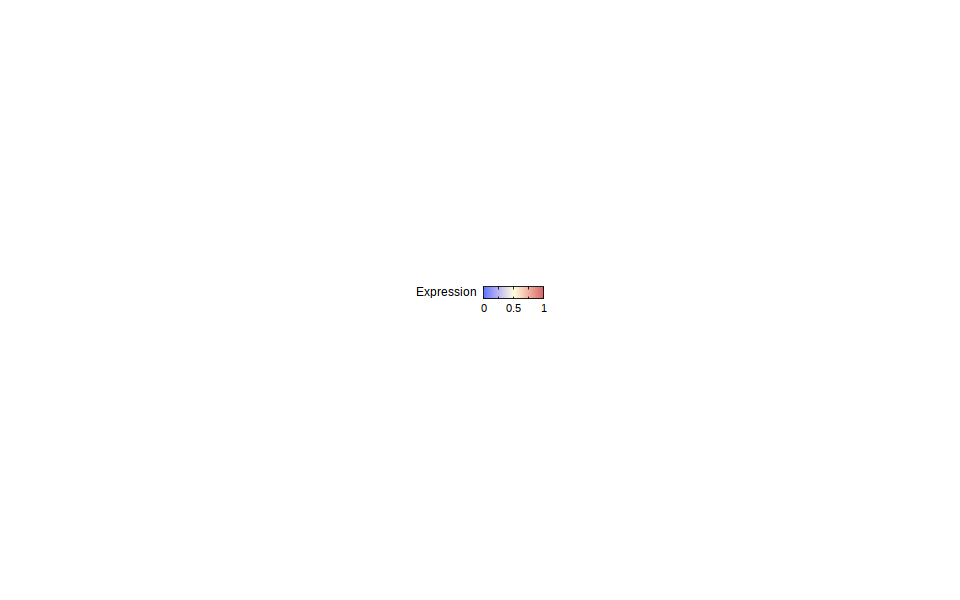

In [478]:
heatmap_legend = ggplot(data.table(x = c(0:1)), aes('a', 'b', color = x)) + 
    geom_point() + 
    guides(colour = guide_colourbar(
         barwidth = 2.5, barheight = 0.5,
        frame.colour = "black", 
        ticks.colour = "black"
    )) + 

    scale_color_gradient2(low='#5a77ff', mid='lightyellow', high='#d66468', midpoint = 0.5, name = 'Expression', breaks = c(0, 0.25, 0.5, 0.75, 1), labels = c(0, '', 0.5, '', 1)) + 
    theme_bw() + 
    theme(legend.position = 'bottom', 
          legend.title = element_text(size = 7, vjust = 1),
          legend.text = element_text(size = 6),
          legend.margin=margin(0,0,0,0))

celltype_legend = as_ggplot(get_legend(heatmap_legend))

celltype_legend
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_RNA_heatmap_legend.pdf'), 
       plot = celltype_legend,
       width = 90, 
       height = 8, 
       units = "mm")

In [19]:
source(here::here('utils.R'))

In [20]:
plot_go = function(plot.dt){
    ggplot(plot.dt, 
           aes(enrichment, Term,  size = DE)) +  #color = -log10(FDR), fill = -log10(FDR),
        geom_bar(stat = 'identity', aes(fill = enrichment), color = NA,  width = 0.05) +
        # geom_point() + 
        geom_text(aes(x = max(plot$enrichment)/100, label = Term), vjust = -0.5, hjust = 0, color = 'black', size = 5 * 0.35) + 
        guides(fill = guide_colourbar(
             barwidth = 0.5, barheight = 2.5,
            frame.colour = "black", 
            ticks.colour = "black"
        )) + 
        scale_fill_gradientn(colors = c('white', 'blue', 'red'), limits = c(0, max(plot.dt$enrichment))) + 
        # scale_color_gradientn(colors = c('white', 'blue', 'red'), limits = c(0, max(-log10(plot$FDR))), name = '-log10(FDR)') + 
        scale_x_continuous(limits = c(0, max(plot.dt$enrichment)), expand = c(0,0,0,1)) + 
        theme_bw() + 
        theme(axis.text = element_text(size = 5, color = 'black'),
                axis.text.y = element_blank(), 
                axis.ticks.y = element_blank(),
                axis.title.x = element_blank(), #element_text(size = 7),
                axis.title.y = element_blank(),
                panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
                panel.background = element_rect(fill = 'white'),
                panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
                plot.margin = margin(0, 0, 0, 0),  # Adjust the margin around the plot
                # legend.margin = margin(0, 0, 0, 0),  # Adjust the margin inside the legend box
                # legend.box.margin = margin(0, 0, 0, 0),  # Adjust the margin outside the legend box
                legend.key.size  = unit(1, "mm"),
                legend.key = element_blank(),
                legend.position = 'none')
}

In [21]:
# GO for cluster 1 & 2 combined
tmp = do_GO(names(group)[group %in% c(1,2)], background = rownames(rna.sce)) # get gene ontology

# plot selected terms
plot = tmp[[1]] %>% copy() %>%
       .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% .[order(-enrichment)] %>% 
       # .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 50 & N < 1000 & DE > 3 & enrichment > 5] %>% .[order(FDR)] %>% 
        .[,Term := factor(Term, levels = rev(Term))] %>% 
        .[, enrichment := ifelse(enrichment > 100, 100, enrichment)]
terms_selected = c('embryonic digit morphogenesis',
                   'positive regulation of canonical Wnt signaling pathway',
                   'regulation of transforming growth factor beta receptor signaling pathway',
                   'epithelial to mesenchymal transition'
                   )
cluster_1_2 = plot_go(plot[Term %in% terms_selected])

In [ ]:
plot = tmp[[1]] %>% copy() %>%
       .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% .[order(-enrichment)] %>% 
       # .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 50 & N < 1000 & DE > 3 & enrichment > 5] %>% .[order(FDR)] %>% 
        .[,Term := factor(Term, levels = rev(Term))] %>% 
        .[, enrichment := ifelse(enrichment > 100, 100, enrichment)]
terms_selected = c('regulation of transforming growth factor beta production',
                    'positive regulation of epithelial to mesenchymal transition',
                   'hindlimb morphogenesis',
                   'artery morphogenesis'
                   )
cluster_3_4 = plot_go(plot[Term %in% terms_selected])

In [54]:
plot = tmp[[1]] %>% copy() %>%
       .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% .[order(-enrichment)] %>% 
       # .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 50 & N < 1000 & DE > 3 & enrichment > 5] %>% .[order(FDR)] %>% 
        .[,Term := factor(Term, levels = rev(Term))] %>% 
        .[, enrichment := ifelse(enrichment > 100, 100, enrichment)]
terms_selected = c('somitogenesis',
                    'formation of primary germ layer',
                   'regulation of epithelial cell differentiation',
                   'gastrulation',
                   'anterior/posterior pattern specification'
                   )
cluster_5_6 = plot_go(plot[Term %in% terms_selected])

In [61]:
plot = tmp[[1]] %>% copy() %>%
       .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% .[order(-enrichment)] %>% 
       # .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 50 & N < 1000 & DE > 3 & enrichment > 5] %>% .[order(FDR)] %>% 
        .[,Term := factor(Term, levels = rev(Term))] %>% 
        .[, enrichment := ifelse(enrichment > 100, 100, enrichment)]
terms_selected = c('regulation of vascular endothelial growth factor receptor signaling pathway',
                    'positive regulation of blood vessel endothelial cell migration	',
                   'vasculogenesis',
                   'positive regulation of epithelial cell migration',
                   'sprouting angiogenesis'
                   )
cluster_9_10 = plot_go(plot[Term %in% terms_selected])

Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


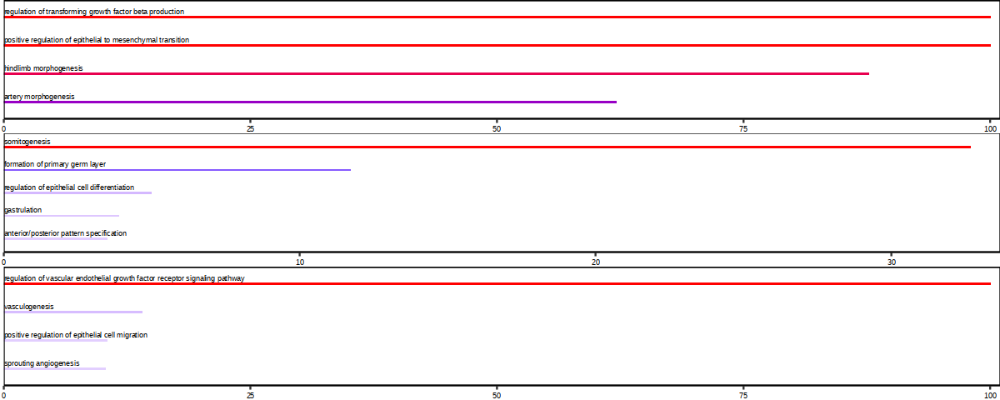

In [65]:
ggarrange(cluster_3_4, cluster_5_6, cluster_9_10, ncol = 1)

In [67]:
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_GO.pdf'), 
       plot = ggarrange(cluster_3_4, cluster_5_6, cluster_9_10, ncol = 1),
       width = 34, 
       height = 62, 
       units = "mm")

Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”
Warning message in max(plot$enrichment):
“no non-missing arguments to max; returning -Inf”


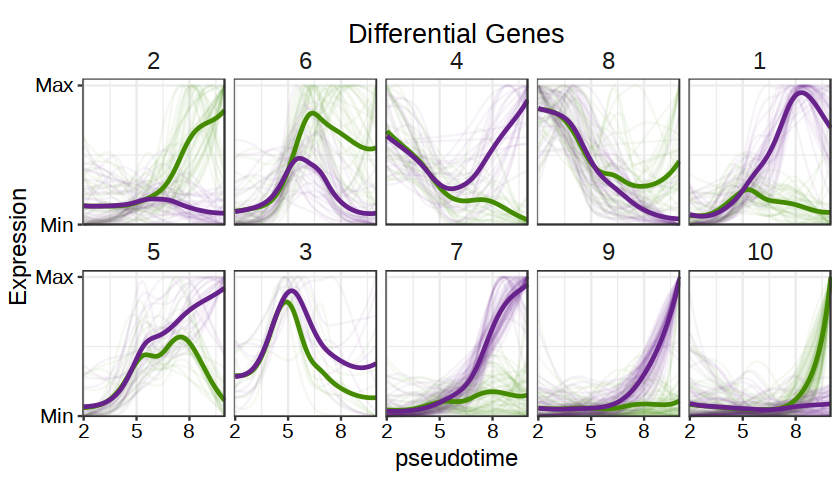

In [131]:
# Other way to plot groups
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)
set.seed(42)
k = 10
group = kmeans(yhatSmooth_minmax, centers = k)$cluster

# Combine all into a single plot
smooth.dt = as.data.table(yhatSmooth, keep.rownames=F) %>% 
    .[,yhat := minmax(yhat), by='gene'] %>% 
    .[,trajectory := ifelse(lineage == '1', 'Trajectory1', 'Trajectory2')] %>%
    .[,trajectory := factor(trajectory, levels=c('Trajectory1', 'Trajectory2'))] %>% 
    merge(., 
          as.data.table(group, keep.rownames=T) %>% setnames('rn', 'gene'),
          by='gene') %>%
    setnames(c('yhat', 'time'), c('MinMax_Expr', 'pseudotime')) %>%
    .[,group := factor(group, levels = c(2, 6, 4, 8, 1, 5, 
                                         3, 7, 9, 10
                                         ))]

mean.dt = smooth.dt %>% copy() %>% 
    .[,MinMax_Expr := mean(MinMax_Expr), by=c('group', 'trajectory', 'pseudotime')] %>% 
    unique(by=c('group', 'trajectory', 'pseudotime'))

options(repr.plot.height=4, repr.plot.width=7)

ggplot(smooth.dt, aes(pseudotime, MinMax_Expr, col=trajectory, group.by=gene)) + 
    geom_line(alpha=0.05, linewidth=0.5) +
    geom_line(data=mean.dt, linewidth=1) + 
    scale_color_manual(values=c(Trajectory1='chartreuse4', Trajectory2='darkorchid4'), name='Trajectory') + 
 #   scale_color_manual(values=c('YS_traj' = 'black', 'Allantois_Traj' = 'red'), name='Trajectory') + 
    scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0), breaks = c(0,1), labels = c('Min', 'Max')) + 
    facet_wrap(~group, ncol=5) + 
    ggtitle('Differential Genes') + 
    ylab('Expression') + 
    theme_bw() + 
    theme(strip.background=element_blank(),
            strip.text = element_text(size=14),
            axis.title = element_text(size=14, color='black'),
            axis.text = element_text(color='black', size = 12), 
            plot.title = element_text(color = 'black', size = 16, hjust = 0.5, vjust = -2),
            legend.position = 'none')

In [17]:
#within_pseudotime_cells = c(lineage1_keep, lineage2_keep)

In [14]:
# Maybe just plot with predictSmooth values since they don't go below 0 so look a bit nicer
plots = mclapply(1:length(unique(group)), function(x){
    genes = names(group)[group == x]
    
    RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
            setnames(c('lineage', 'time', 'yhat'), c('Traj', 'pseudotime', 'Expr')) %>%
            .[,gene:=factor(gene, levels = genes_keep)] %>%
            .[,Traj:=as.character(Traj)]

    p = ggplot(RNA_filt.dt, aes(pseudotime, Expr, color=Traj)) + 
        #    geom_point(size=0.2, alpha=0.2) +
            geom_line(linewidth = 1.3) + 
            scale_color_manual(values=c('1'='chartreuse4', '2'='darkorchid4'), name='Trajectory') + 
            scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 50, 3))) + 
            scale_y_continuous(expand=c(0,0, 0.1, 0), breaks=seq(0, 1e3, 3)) + 
        #    geom_smooth(se = F) +
            geom_hline(yintercept=0) +
            facet_wrap(~gene, ncol=12, scales='free_y') + 
            theme_bw() + 
            theme(strip.background = element_blank(),
                  text = element_text(size=20),
                  axis.text = element_text(color='black'),
                  axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                  axis.text.y = element_blank())
    return(p)
}, mc.cores=6)

In [19]:
suppressPackageStartupMessages({
    library(biomaRt)
    library(limma)
    library(org.Mm.eg.db)
})

mm10mart <- useMart(dataset = "mmusculus_gene_ensembl", biomart = "ensembl")
mapping <- getBM(
  attributes = c('hgnc_symbol', 'ensembl_gene_id', 'entrezgene_id', 'external_gene_name'), 
  mart = mm10mart
)
mapping = as.data.table(mapping)
fwrite(mapping, '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.07052024.txt')

In [170]:
i = c(2,6,8,4) # Early YS
i = c(3,7) # Really early Allantois
# i = c(3,7,9) # Early Allantois
#i = c(1,5) # Late YS
#i = 10 # Late Allantois
# Retrieve GO
go = as.data.table(goana(mapping[match(names(group)[group %in% i], external_gene_name),entrezgene_id], species="Mm"), keep.rownames=T) %>% setnames('rn', 'GOALL') %>% 
    .[order(P.DE)] %>%
    .[,FDR := p.adjust(P.DE, method = 'fdr')] %>% 
    .[P.DE < 0.1] %>% 
    .[, enrichment := (length(names(group)[group %in% i])/N) / (N/32285)] %>%  # 32285 = nrow(rna.sce)
    .[, enrichment := ifelse(enrichment > 100, 100, enrichment)] # set threshold for enrichment at 100
# Add gene names to annotations
GO_genes = AnnotationDbi::select(org.Mm.eg.db, keytype="GOALL", keys=go[, GOALL], columns='ENTREZID') %>% 
    as.data.table() %>% 
    .[, EVIDENCEALL := NULL] %>% 
    unique() %>% 
    merge(., mapping[,c('entrezgene_id', 'external_gene_name')] %>% 
              .[, entrezgene_id := as.character(entrezgene_id)],
          by.x = 'ENTREZID', by.y = 'entrezgene_id')
# Add genes into GO list
go2 = mclapply(1:nrow(go), function(x){ # nrow(go)
    GO_genes_tmp = GO_genes[GOALL == go[x, GOALL], external_gene_name]
    genes_GO = intersect(GO_genes_tmp, names(group)[group %in% i])
    tmp = go[x,] %>% .[, genes := paste0(genes_GO, collapse = ', ')]
}, mc.cores = 10) %>% rbindlist()
head(go2[order(-enrichment, -DE)][FDR < 0.05], 6)

'select()' returned 1:many mapping between keys and columns



GOALL,Term,Ont,N,DE,P.DE,FDR,enrichment,genes
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GO:0030177,positive regulation of Wnt signaling pathway,BP,140,6,8.977511e-07,0.001290610,100,"Lgr4, Smad3, Wnt5a, Ror2, Lypd6, Ptk7"
GO:0090263,positive regulation of canonical Wnt signaling pathway,BP,108,5,5.274785e-06,0.004641202,100,"Lgr4, Smad3, Ror2, Lypd6, Ptk7"
GO:0048565,digestive tract development,BP,128,5,1.208073e-05,0.007086433,100,"Lgr4, Ephb3, Id2, Smad3, Wnt5a"
GO:2000027,regulation of animal organ morphogenesis,BP,133,5,1.454573e-05,0.008116164,100,"Lgr4, Msx1, Wnt5a, Ror2, Ptk7"
GO:0055123,digestive system development,BP,141,5,1.928740e-05,0.009282172,100,"Lgr4, Ephb3, Id2, Smad3, Wnt5a"
GO:0030326,embryonic limb morphogenesis,BP,143,5,2.064193e-05,0.009282172,100,"Msx1, Wnt5a, Ror2, Chst11, Sall4"


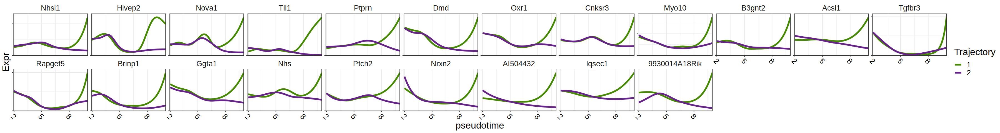

In [464]:
options(repr.plot.height=4, repr.plot.width=30)
plots[[1]]

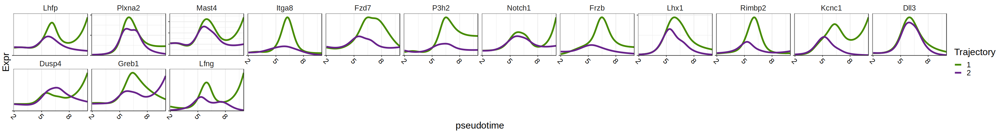

In [465]:
options(repr.plot.height=4, repr.plot.width=30)
plots[[2]]

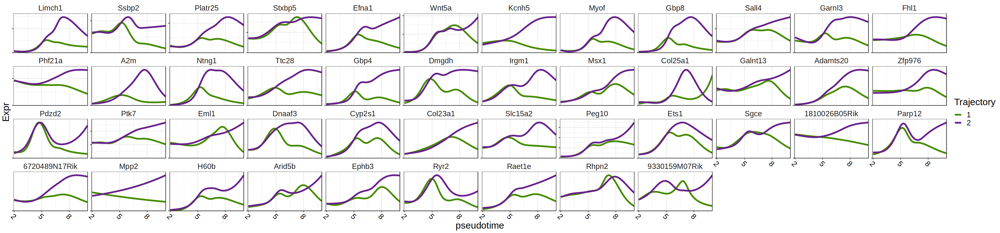

In [466]:
options(repr.plot.height=7, repr.plot.width=30)
plots[[3]]

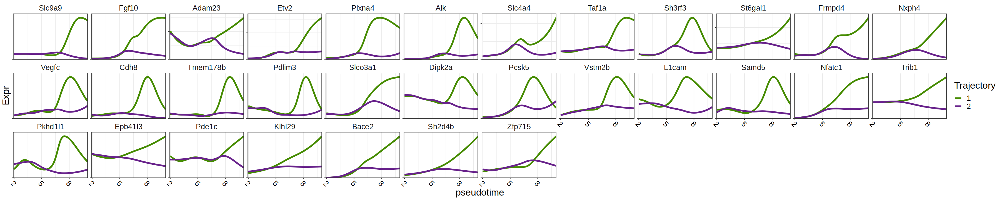

In [467]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[4]]

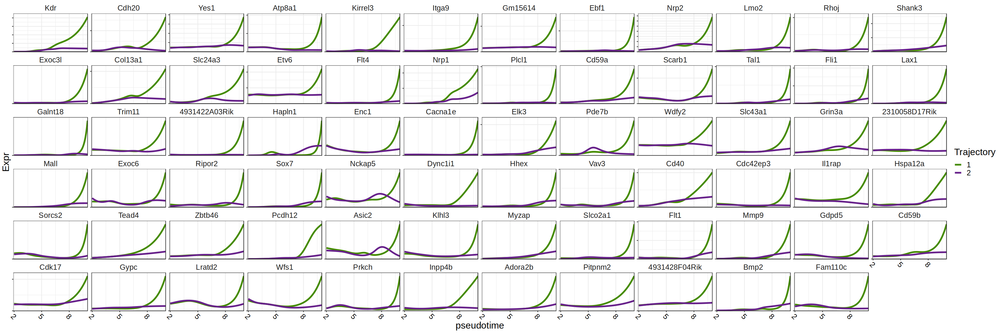

In [457]:
options(repr.plot.height=10, repr.plot.width=30)
plots[[5]]

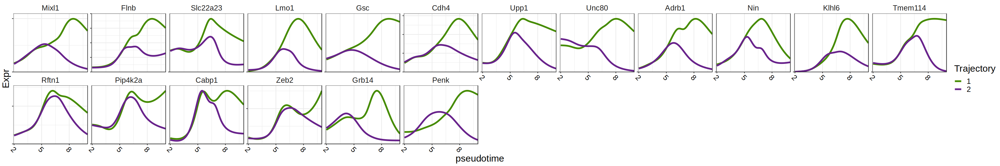

In [468]:
options(repr.plot.height=5, repr.plot.width=30)
plots[[6]]

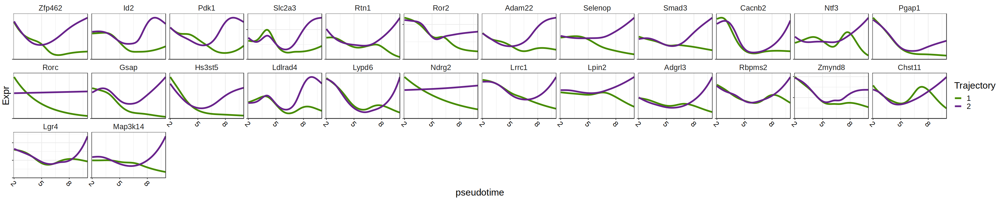

In [481]:
options(repr.plot.height=6, repr.plot.width=30)
plots[[7]]

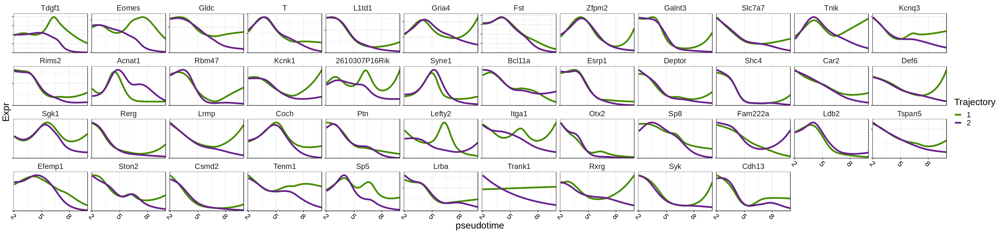

In [470]:
options(repr.plot.height=7, repr.plot.width=30)
plots[[8]]

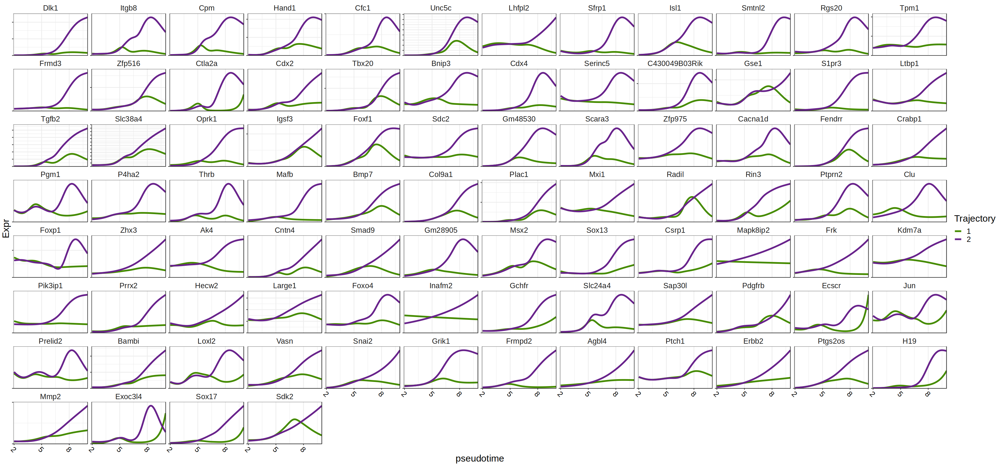

In [472]:
options(repr.plot.height=14, repr.plot.width=30)
plots[[9]]

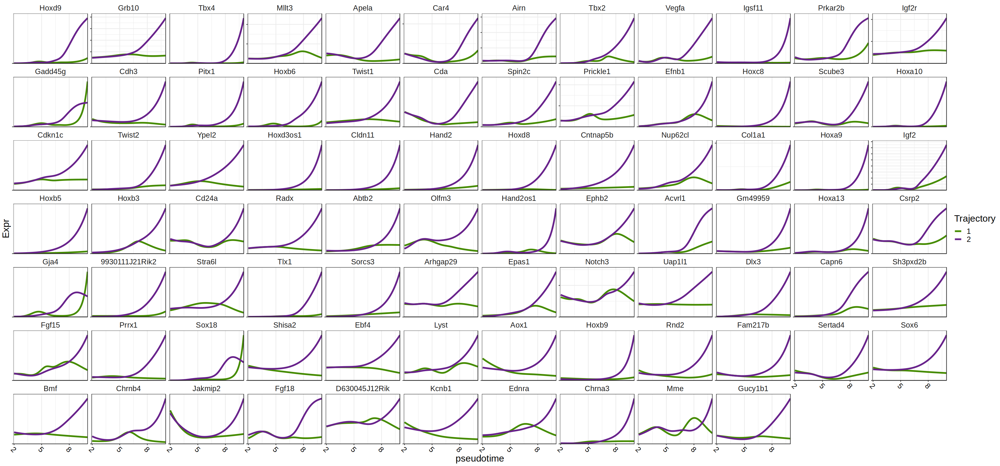

In [473]:
options(repr.plot.height=14, repr.plot.width=30)
plots[[10]]

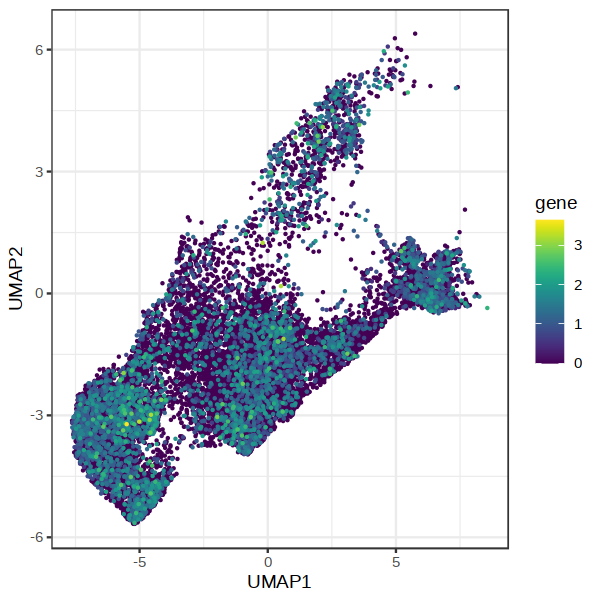

In [338]:
options(repr.plot.height=5, repr.plot.width=5)
gene = 'Smad3'
tmp = meta %>% copy() %>%
    .[,gene := as.vector(logcounts(rna.sce[gene,]))] %>% 
    .[order(gene)] %>% 
    .[genotype == 'WT'] %>% 
    .[]

ggplot(tmp, aes(UMAP1, UMAP2, col=gene)) + 
    geom_point(size = 0.2) +
    viridis::scale_color_viridis() + 
    theme_bw()

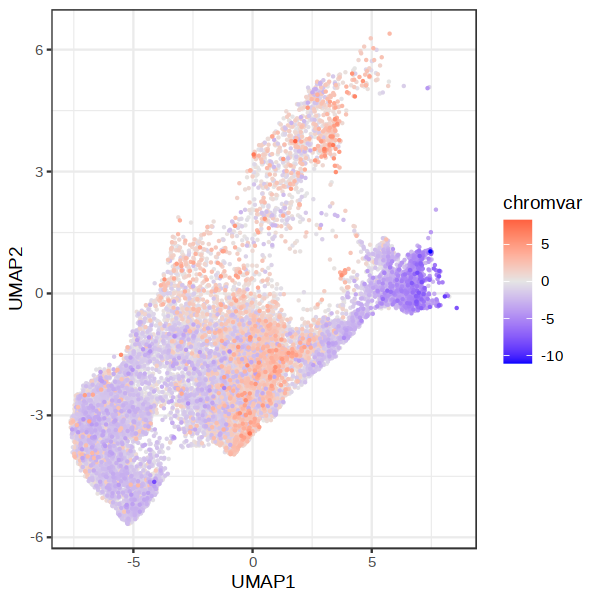

In [330]:
tmp$chromvar = as.vector(assay(chromvar.sce[str_to_upper(gene), tmp$cell], 'z'))

tmp = tmp %>% 
    .[order(abs(chromvar))] %>% 
    .[genotype == 'WT'] %>% 
    .[]

ggplot(tmp, aes(UMAP1, UMAP2, col=chromvar)) + 
    geom_point(size = 0.2) +
    scale_color_gradient2(low = 'blue', mid = 'grey90', high = 'red') + 
    theme_bw()

### Plot genes for paper

In [25]:
# Get ChromVAR for TFs
ArchRProject <- suppressMessages(loadArchRProject(io$archR.directory))

addArchRThreads(12)
chromvar.sce = getMatrixFromProject(ArchRProject, 'silicoChIP_CISBP_v2')
rownames(chromvar.sce) = str_split(str_to_upper(rownames(chromvar.sce)), '_') %>% map_chr(1)

Setting default number of Parallel threads to 12.

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-32904bcf22ff9-Date-2024-07-08_Time-09-46-53.log
If there is an issue, please report to github with logFile!

2024-07-08 09:47:23 : Organizing colData, 0.499 mins elapsed.

2024-07-08 09:47:24 : Organizing rowData, 0.516 mins elapsed.

2024-07-08 09:47:24 : Organizing rowRanges, 0.516 mins elapsed.

2024-07-08 09:47:24 : Organizing Assays (1 of 2), 0.516 mins elapsed.

2024-07-08 09:47:25 : Organizing Assays (2 of 2), 0.541 mins elapsed.

2024-07-08 09:47:27 : Constructing SummarizedExperiment, 0.569 mins elapsed.

2024-07-08 09:47:28 : Finished Matrix Creation, 0.589 mins elapsed.



In [28]:
## Get pseudotime and lineage assignment
crv.dt = as.data.table(sceGAM$crv, keep.rownames = T) %>% setnames('rn', 'cell')
# Convert into long format (pseudotime & weights done separately)
crv.dt = merge(crv.dt %>% copy() %>% .[,1:3] %>% melt(id.vars = 'cell', variable.name = 'lineage', value.name = 'pseudotime'),
               crv.dt %>% copy() %>% .[,c(1,4:5)] %>% melt(id.vars = 'cell', variable.name = 'lineage_weight', value.name = 'weight'),
               by = 'cell') %>% 
         # Only keep pseudotime for assigned lineage
         .[weight == 1] %>%
         .[, `:=`(lineage = gsub('pseudotime.Lineage', '', lineage),
                  lineage_weight = gsub('cellWeights.V', '', lineage_weight))] %>% 
         .[lineage == lineage_weight] %>% 
         # remove redundant columns
         .[, `:=`(weight = NULL,
                  lineage_weight = NULL)] %>% 
        .[]

# Add in metadata of all other cells (including ones not used for pseudotime)
meta3 = merge(fread(args$metadata), crv.dt, by = 'cell', all.x = T) %>% 
    .[,c('cell', 'lineage', 'pseudotime')] %>% 
    .[!is.na(lineage)]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“Using linewidth for a discrete variable is not advised.”


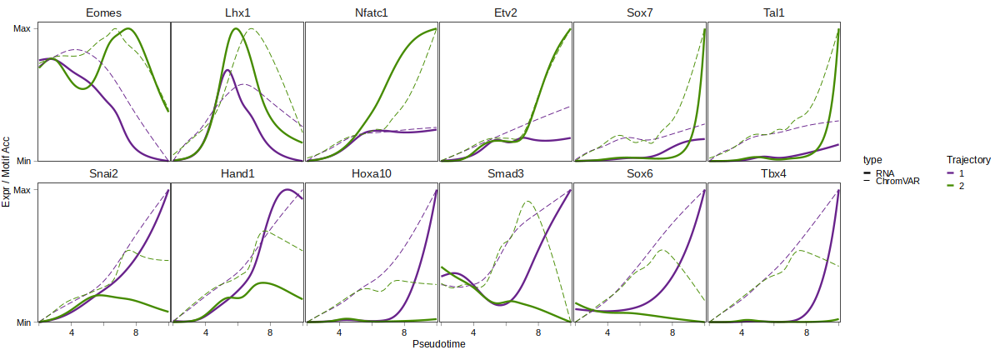

In [52]:
genes = c('Eomes', 'Lhx1', 'Nfatc1', 'Etv2', 'Sox7', 'Tal1',
          'Snai2', 'Hand1', 'Hoxa10',  'Smad3','Sox6', 'Tbx4'
         )

# Get smoothed gene expression
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

# Normalise and clean up
RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
        .[,yhat_minmax := minmax.normalisation(yhat), by = 'gene'] %>% 
        setnames(c('time', 'yhat_minmax'), c('pseudotime', 'value')) %>%
        .[,gene:=factor(gene, levels = genes)] %>%
        .[,lineage:=as.character(lineage)] %>% 
        .[,c('gene', 'pseudotime', 'lineage', 'value')]

# Get chromVAR in the same format
chromVAR_filt.dt = as.data.table(assay(chromvar.sce[intersect(rownames(chromvar.sce), str_to_upper(genes))], 'z'), keep.rownames = T) %>% 
    setnames('rn', 'gene') %>% 
    melt(id.vars = 'gene', variable.name = 'cell', value.name = 'value') %>% 
    merge(., meta3, by = 'cell') %>%
    .[,c('gene', 'pseudotime', 'lineage', 'value')] %>% 
    .[]

# Get smoothed and normalised chromVAR curves
chromvar_smooth = mclapply(intersect(str_to_title(unique(chromVAR_filt.dt$gene)), unique(RNA_filt.dt$gene)), function(x){
    tmp = lapply(c('1', '2'), function(i){
                tmp2 = data.table(gene = x,
                                 pseudotime = RNA_filt.dt[gene == x & lineage == i, pseudotime],
                                 lineage = i) %>% 
                .[, value := predict(mgcv::gam(value ~ s(pseudotime, bs = "cs"), data = chromVAR_filt.dt[gene == str_to_upper(x) & lineage == i]), 
                    newdata = data.frame(pseudotime = RNA_filt.dt[gene == x & lineage == i, pseudotime]), 
                    type = "response")] %>% 
                .[]
        }) %>% rbindlist()
    return(tmp)
}) %>% rbindlist() %>% 
    .[, value := minmax.normalisation(value), by = c('gene')]

# Combine expression & chromVAR
to.plot = rbind(RNA_filt.dt[,type:='RNA'], chromvar_smooth[,type:='ChromVAR']) %>% 
    .[,type := factor(type, levels = c('RNA', 'ChromVAR'))] 

# change trajectory order
trajectory_change = c('1' = '2',
                      '2' = '1')
to.plot = to.plot %>% 
    .[,lineage := trajectory_change[match(lineage, names(trajectory_change))]]

# Plot TFs along pseudotime
p_TF = ggplot(to.plot, aes(pseudotime, value, color=lineage)) + 
        geom_line(aes(linewidth = type, linetype = type, alpha = type)) + 
        scale_alpha_discrete(range = c(1, 1)) + 
        scale_linewidth_discrete(range = c(0.5, 0.2)) + 
        scale_linetype_manual(values = c("RNA" = 1, "ChromVAR" = 5)) +
        scale_color_manual(values=c('2'='chartreuse4', '1'='darkorchid4'), name='Trajectory') + 
        scale_x_continuous(expand=c(0.01,0.01), breaks=c(seq(2, 10, 2)), labels = c('', 4,'',8, '')) + 
        scale_y_continuous(expand=c(0,0, 0.05, 0), breaks = c(0,1), labels = c('Min', 'Max')) + 
        guides(color = guide_legend(nrow=2,byrow=TRUE),
               linetype = guide_legend(nrow = 2)) +
        geom_hline(yintercept=0, linewidth = 0) +
        facet_wrap(~gene, nrow=2, scales='fixed') + 
        ylab('Expr / Motif Acc') + xlab('Pseudotime') + 
        theme_bw() + 
        theme(strip.background = element_blank(),
                strip.text = element_text(size = 8, vjust = -0.5),
                text = element_text(size=6),
                axis.text = element_text(color='black', size = 6),
                axis.text.x = element_text(angle=0, hjust=0.5, vjust=1, size = 6),
                axis.title = element_text(size = 7),
                legend.text = element_text(size = 6),
                legend.title = element_text(size = 7),
                legend.position = 'right',
                legend.box = "horizontal",
                legend.key.size = unit(2, "mm"),
                panel.border = element_rect(color='black', linewidth=0.15, fill=NA),
                panel.background = element_blank(),
                axis.line = element_blank(),
                axis.line.x = element_blank(),
                axis.ticks = element_line(linewidth=0.1),
                panel.grid.major = element_blank(), 
                panel.grid.minor = element_blank(),
                panel.spacing = unit(0.4, 'mm'),
                panel.spacing.y=unit(0, "lines"),
                plot.margin = margin(t = 0, r = 1, b = 0, l = 1)
)

options(repr.plot.height=3.5, repr.plot.width=10)
p_TF

In [53]:
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_genes_TFs.pdf'), 
       plot = p_TF + theme(legend.position = 'none'),
       width = 80, 
       height = 50, 
       units = "mm")

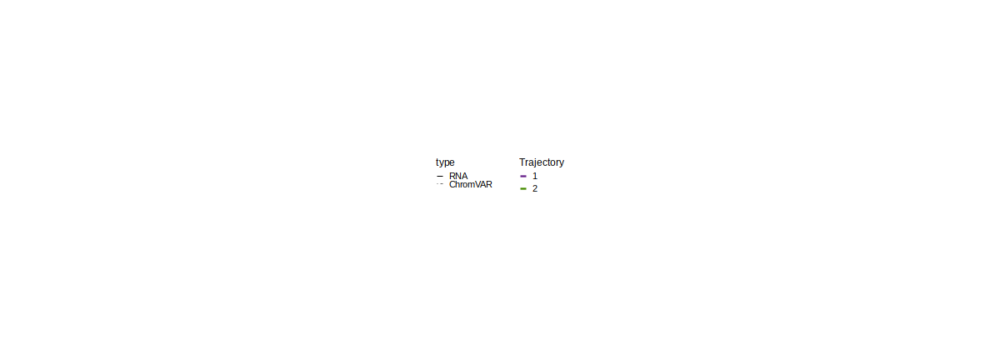

In [38]:
celltype_legend = as_ggplot(get_legend(p_TF))

celltype_legend
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_genes_legend.pdf'), 
       plot = celltype_legend,
       width = 40, 
       height = 12, 
       units = "mm")

In [80]:
# Plot set of interesting genes
plot_genes = function(genes){
    RNA_filt.dt = as.data.table(yhatSmooth[yhatSmooth$gene %in% genes,]) %>% 
            .[,yhat_minmax := minmax(yhat), by = 'gene'] %>% 
            setnames(c('time', 'yhat_minmax'), c('pseudotime', 'value')) %>%
            .[,gene:=factor(gene, levels = genes)] %>%
            .[,lineage:=as.character(lineage)] %>% 
            .[,c('gene', 'pseudotime', 'lineage', 'value')]

    p = ggplot(RNA_filt.dt, aes(pseudotime, value, color=lineage, size = 0.5)) + 
        geom_line(linewidth = 0.5) + 
        scale_color_manual(values=c('1'='chartreuse4', '2'='darkorchid4'), name='Trajectory') + 
        scale_x_continuous(expand=c(1e-3,1e-3), breaks=c(seq(2, 10, 2)), labels = c('', 4,'',8, '')) + 
        scale_y_continuous(expand=c(0,0, 0.1, 0), breaks = c(0,1), labels = c('Min', 'Max')) + 
        guides(color = guide_legend(nrow=2,byrow=TRUE),
               linetype = guide_legend(nrow = 2)) +
        geom_hline(yintercept=0, linewidth = 0) +
        facet_wrap(~gene, nrow=2, scales='fixed') + 
        ylab('Expression') + xlab('Pseudotime') + 
        theme_bw() + 
        theme(strip.background = element_blank(),
                strip.text = element_text(size = 8, vjust = -0.5),
                text = element_text(size=6),
                axis.text = element_text(color='black', size = 6),
                axis.text.x = element_text(angle=0, hjust=0.5, vjust=1, size = 6),
                axis.text.y = element_text(size = 6),
                axis.title.y = element_text(size = 7, color = 'black'), 
                axis.title = element_text(size = 7),
                legend.text = element_text(size = 6),
                legend.title = element_text(size = 7),
                legend.position = 'none',
                legend.box = "horizontal",
                legend.key.size = unit(2, "mm"),
                panel.border = element_rect(color='black', linewidth=0.15, fill=NA),
                panel.background = element_blank(),
                axis.line = element_blank(),
                axis.line.x = element_blank(),
                axis.ticks = element_line(linewidth=0.1, color = 'black'),
                panel.grid.major = element_blank(), 
                panel.grid.minor = element_blank(),
                panel.spacing = unit(0.4, 'mm'),
                panel.spacing.y=unit(0, "lines"),
                plot.margin = margin(t = 0, r = 1, b = 0, l = 1)
)
    return(p)
}

# Cell signalling
options(repr.plot.height=4, repr.plot.width=15)
genes = c(
'Notch1','Fzd7',  'Frzb', 'Fgf10','Vegfc', 'Kdr','Bmp2','Tdgf1', 'Tgfbr3','Lefty2',
'Notch3', 'Wnt5a','Lgr4', 'Fgf15', 'Fgf18', 'Igf2r', 'Igf2', 'Pdgfrb', 'Bmp7', 'Bambi', 'Tgfb2', 'Smad9')
p_signalling = plot_genes(genes)


# Cell matrix
options(repr.plot.height=4, repr.plot.width=15)
genes = c('Itga8',  'Plxna4', 'Cdh8', 'Vstm2b', 'L1cam', 'Cdh20', 'Itga9', 'Nrp2', 'Hapln1', 'Cdh4','Tmem114',
          'Unc5c','Col25a1', 'Adamts20', 'Adam22',  'Itgb8', 'Col9a1', 'Plac1', 'Cdh3')
p_ECM = plot_genes(genes)

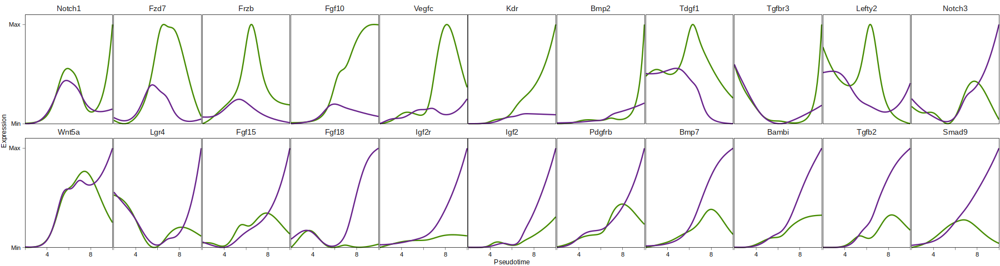

In [81]:
p_signalling

In [82]:
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_genes_signalling.pdf'), 
       plot = p_signalling,
       width = 190, 
       height = 50, 
       units = "mm")

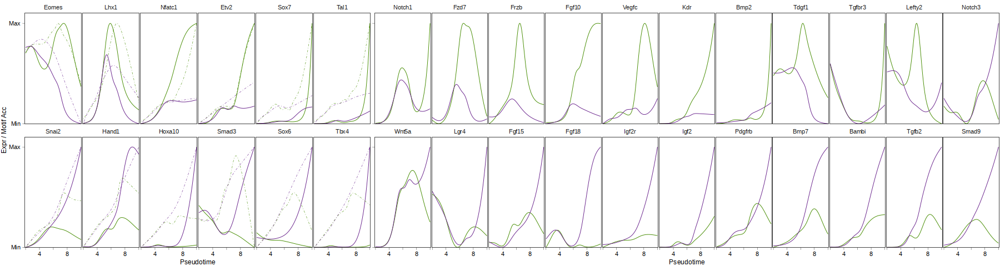

In [119]:
ggarrange(p_TF + theme(legend.position = 'none'), NULL, p_signaling, widths = c(6.5, 11))

In [123]:
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_genes_all.pdf'), 
       plot = ggarrange(p_TF + theme(legend.position = 'none'), NULL, p_signaling, widths = c(6.5, 0.1, 11), nrow = 1),
       width = 173, 
       height = 35, 
       units = "mm")

# ATAC - Differential accessibility along trajectory

## Linking peaks to genes

In [6]:
# atac sce
args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')

In [7]:
######
#### Find peak2gene linkage
######

# Get full RNA & ATAC datasets
# Load meta
meta = fread(args$metadata)[day%in%c('D3', 'D3.5', 'D4', 'D4.5', 'D5') & genotype=='WT']
# load sce rna
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# load sce atac
atac.sce = readRDS(args$peakmtx)[, meta$cell]
colData(atac.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# load mofa factors
mofa = fread(file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')) %>% 
    .[match(colnames(rna.sce), cell),] %>% 
    as.data.frame() %>% tibble::column_to_rownames('cell') %>% 
    as.matrix

In [9]:
## First cluster cells at high resolution (replicating meta cells)
# Convert to Seurat
suppressPackageStartupMessages(library(Seurat))
seurat = as.Seurat(rna.sce)
seurat[["mofa"]] <- CreateDimReducObject(embeddings = mofa, key = "mofa_", assay = DefaultAssay(seurat))

# First find high resolution clusters across the whole WT dataset
seurat <- FindNeighbors(seurat, reduction  = 'mofa')
seurat <- FindClusters(seurat, resolution = 1.5)
paste0('Number of Clusters: ', length(unique(Idents(seurat))))

# Pseudobulk ATAC and RNA matrices by those clusters
rna.pb = aggregateAcrossCells(rna.sce, id=Idents(seurat), statistics="sum", use.assay.type="counts",  BPPARAM = BPPARAM)
atac.pb = aggregateAcrossCells(atac.sce, id=Idents(seurat), statistics="sum", use.assay.type="PeakMatrix",  BPPARAM = BPPARAM)

# Normalise
assay(rna.pb,"logcounts") <- log(1e6*(sweep(assay(rna.pb),2,colSums(assay(rna.pb),na.rm=T),"/"))+1)
assay(atac.pb,"logcounts") <- log(1e6*(sweep(assay(atac.pb),2,colSums(assay(atac.pb),na.rm=T),"/"))+1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 19740
Number of edges: 604142

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7910
Number of communities: 22
Elapsed time: 2 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


[1] "Number of Clusters: 22"

In [10]:
## Define functions:
# Linking peaks to genes 
annotate_peaks = function(gene_metadata.dt = gene_metadata.dt,
                          atac.sce = atac.sce,
                          distance = 1.5e5){
    
    # Load gene metadata
    gene_metadata <- copy(gene_metadata.dt) %>% 
      .[,chr:=as.factor(sub("chr","",chr))] %>%
      setnames("symbol","gene") %>%
      .[, c("chr","start","end","gene","ens_id","strand")]

    peakSet.dt <- data.table(peak = rownames(atac.sce)) %>%
        .[,`:=`(chr = as.factor(peak %>% str_split(':') %>% map_chr(1) %>% gsub('chr', '', .)),
                start = as.integer(peak %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(1)),
                end = as.integer(peak %>% str_split(':') %>% map_chr(2) %>% str_split('-') %>% map_chr(2)))] %>%
        .[,c('chr', 'start', 'end', 'peak')] %>% 
      setkey(chr,start,end)

    ## Overlap 
    gene_metadata.ov <- copy(gene_metadata) %>%
      .[strand=="+",c("gene.start","gene.end"):=list(start,end)] %>%
      .[strand=="-",c("gene.start","gene.end"):=list(end,start)] %>%
      .[strand=="+",c("start","end"):=list (gene.start-distance, gene.end+distance)] %>%
      .[strand=="-",c("end","start"):=list (gene.start+distance, gene.end-distance)] %>% 
      setkey(chr,start,end)

    stopifnot((gene_metadata.ov$end-gene_metadata.ov$start)>0)

    ov <- foverlaps(
      peakSet.dt,
      gene_metadata.ov,
      nomatch = NA
    ) %>%  .[,c("start","end"):=NULL] %>%
      setnames(c("i.start","i.end"),c("peak.start","peak.end")) %>%
      .[,peak.mean:=(peak.start+peak.end)/2] %>%
      # calculate distance from the peak to the genebody
      .[,dist:=min(abs(gene.end-peak.mean), abs(gene.start-peak.mean)), by=c("gene","ens_id","peak","strand")] %>%
      .[strand=="+" & peak.mean>gene.start & peak.mean<gene.end,dist:=0] %>%
      .[strand=="-" & peak.mean<gene.start & peak.mean>gene.end,dist:=0]
    
    return(ov)   
}

# Correlating peaks accessibility with gene expression 
cor_acc_gene = function(rna, 
                        atac, 
                        peak_gene_links,
                        correlation_method = "pearson", 
                        cores = detectCores()-2){
    
  gene = unique(peak_gene_links$gene)
    peak_gene_links.dt = mclapply(gene, function(i){
      cat(i, '\n')
      # Get peaks of near gene
      peaks_i <- peak_gene_links[gene==i,peak]

      # calculate correlations between peak accessibility and nearby gene expression
      corr_output <- psych::corr.test(
        x = t(logcounts(rna[i,])), 
        y = t(assay(atac[peaks_i,],"logcounts")), 
        ci = FALSE,
        method = correlation_method
      )

      # create data.table containing cor & pval
      results.dt = data.table(peak = colnames(corr_output$r),
                              cor = round(corr_output$r[1,],3),
                              pval = corr_output$p[1,],
                              distance = peak_gene_links[gene==i,dist]) %>%
  #     .[match(rownames(atac.sce), peak), ] %>% # order peaks by original order
  #     .[,pval := ifelse(peak %in% colnames(corr_output$r), pval, 1)] %>% # Add pvalue = 1 for peaks not in set
       .[,gene := i]

        return(results.dt)
    }, mc.cores=cores) %>% dplyr::bind_rows(.)
    return(peak_gene_links.dt)
}

In [19]:
# Find all peaks in 150kb on either end every gene
ArchRProject <- loadArchRProject(io$archR.directory)
gene_metadata.dt = as.data.table(ArchRProject@geneAnnotation$genes) %>% 
   # .[symbol %in% genes_keep] %>% 
    .[symbol %in% rownames(rna.pb)] %>% 
    setnames(c('seqnames', 'gene_id'), c('chr', 'ens_id'))

genes_peaks = annotate_peaks(gene_metadata.dt = gene_metadata.dt,
                          atac.sce = atac.sce,
                          distance = 1.5e5)
paste0('Number of linked peaks: ', nrow(genes_peaks[!is.na(gene),]))

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

[1] "Number of linked peaks: 1220939"

[1] "Number of Significant Enhancers: 102578"

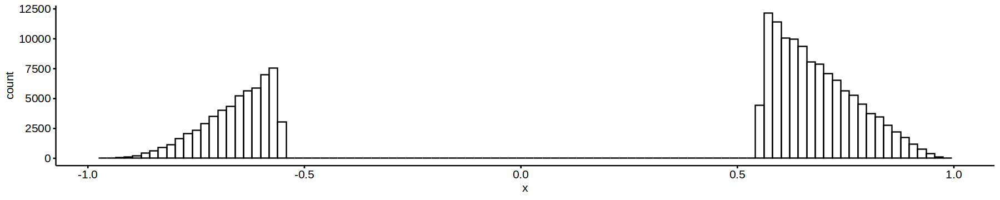

In [20]:
# Calculate peak gene correlation
peak_gene_correlation = cor_acc_gene(rna = rna.pb, 
                            atac = atac.pb, 
                            peak_gene_links = genes_peaks[!is.na(gene)],
                            correlation_method = "pearson", 
                            cores = detectCores() - 2) %>%
    .[,padj := p.adjust(pval, method='fdr')]

options(repr.plot.height=3, repr.plot.width=15)
gghistogram(peak_gene_correlation[padj<0.05, cor], bins=100)
paste0('Number of Significant Enhancers: ', length(unique(peak_gene_correlation[padj<0.05, peak])))

In [23]:
fwrite(peak_gene_correlation, file.path(args$outdir, 'acc_gene_correlation.txt.gz'))

In [16]:
peak_gene_correlation = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))

In [ ]:
# Only continue with the enhancers for significantly different peaks
patternGenes = fread(file.path(args$outdir, 'patternGenes.txt.gz'))
endGenes = fread(file.path(args$outdir, 'endGenes.txt.gz'))
genes_keep = unique(rbind(patternGenes[,c('gene', 'waldStat', 'padj', 'sig')], endGenes[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)

peak_gene_correlation = peak_gene_correlation[gene %in% genes_keep]

In [17]:
plot_correlation = function(peak, gene){
    tmp = data.table(rna = as.vector(logcounts(rna.pb[gene,])),
                        atac = as.vector(atac.pb@assays@data$logcounts[peak,]))
                     
    ggplot(tmp, aes(rna, atac)) + 
            geom_point() + 
            geom_smooth(method = 'lm') + 
            geom_abline(slope=1) + 
            theme_bw() 
}

`geom_smooth()` using formula = 'y ~ x'


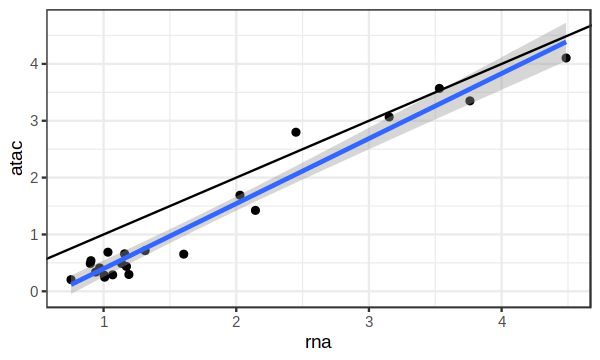

In [21]:
options(repr.plot.height=3, repr.plot.width=5)
x = 2
tmp = peak_gene_correlation[padj<0.05][order(-cor)]
plot_correlation(tmp[[x,1]], tmp[[x,5]])

In [46]:
# Load data
sceGAM = readRDS(file.path(args$outdir, 'sceGAM.rds'))
rna.sce = readRDS(file.path(args$outdir, 'rna_sce.rds'))[,colnames(sceGAM)]
peaks.sce = readRDS(args$peakmtx)[,colnames(sceGAM)]
colData(peaks.sce) = colData(rna.sce)

# Get pseudotime and weights from sceGAM (To make sure the exact same weights are used between modalities)
pseudotime = as.data.frame(sceGAM$crv[,c(1,2)])
weight = as.data.frame(sceGAM$crv[,c(3,4)])

In [47]:
summary(colnames(sceGAM) == colnames(rna.sce) ) 
summary(colnames(sceGAM)  == colnames(peaks.sce))
summary(colnames(sceGAM)  == rownames(pseudotime))
summary(rownames(weight)  == rownames(pseudotime))


   Mode    TRUE 
logical   13786 

   Mode    TRUE 
logical   13786 

   Mode    TRUE 
logical   13786 

   Mode    TRUE 
logical   13786 

In [48]:
tmp = data.table(peak = rownames(atac.pb),
                 sum = rowSums(atac.pb@assays@data$PeakMatrix),
                 mean = rowMeans(atac.pb@assays@data$logcounts),
                 var = rowVars(atac.pb@assays@data$logcounts))

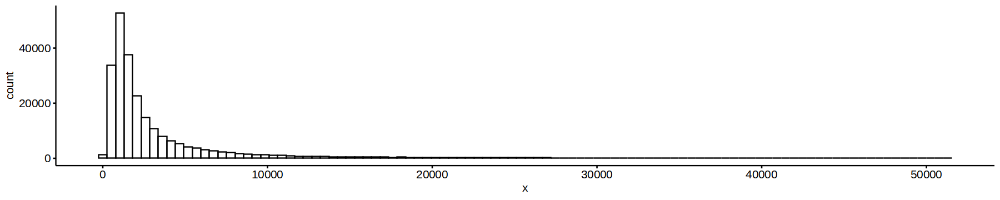

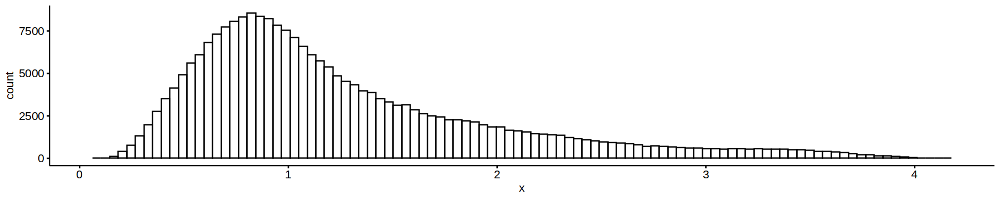

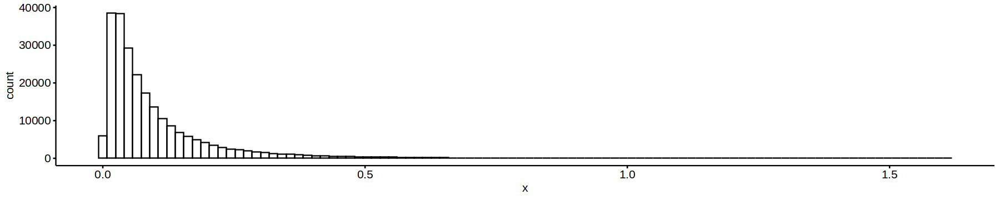

In [49]:
options(repr.plot.height=3)
gghistogram(tmp$sum, bins = 100)
gghistogram(tmp$mean, bins = 100)
gghistogram(tmp$var, bins = 100)

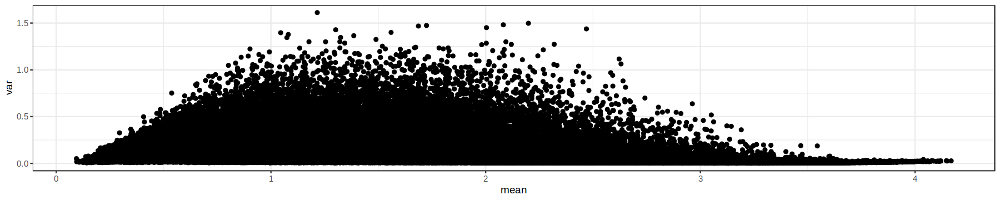

In [50]:
ggplot(tmp, aes(mean, var)) + 
    geom_point() + 
    theme_bw()

In [51]:
# By variance
decomp <- modelGeneVar(atac.pb, BPPARAM = MulticoreParam(16)) # [expression$gene,]
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) 

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


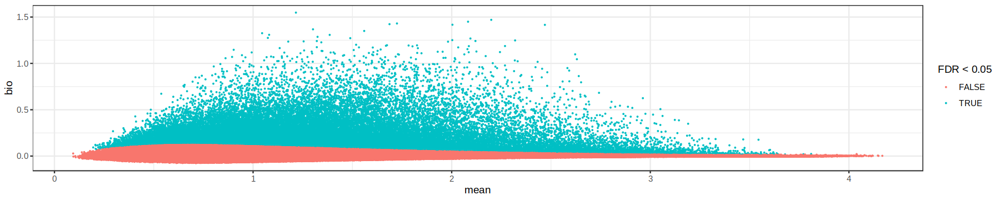

In [52]:
ggplot(hvgs, aes(mean, bio, color = FDR < 0.05)) + 
    geom_point(size = 0.02) + 
    theme_bw()

In [54]:
# Export files to run as Rscript
R_script_list = list(cells = colnames(peaks.sce),
                     peaks = rownames(peaks.sce),
                     peak_stats = hvgs,
                     replicate = peaks.sce$replicate,
                     pseudotime = pseudotime,
                     weight = weight,
                     peak_gene_correlation = peak_gene_correlation)
saveRDS(R_script_list, file.path(args$outdir, 'ATAC_tradeseq_objects.rds'))

In [12]:
test = readRDS(file.path(args$outdir, 'ATAC_tradeseq_objects.rds'))
nrow(test$peak_stats[FDR<0.05])

## ATAC - peaks linked to differential genes only

Output from 09_Eomes_invitro_blood/code/rna_atac/trajectory/v3/01_tradeSeq_ATAC.R

In [194]:
# # atac sce
# args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')

# # outdir
# args$outdir = file.path(io$basedir, 'results/rna_atac/trajectory/v2')
# dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

# print('Loading objects')
# R_script_list = readRDS(file.path(args$outdir, 'ATAC_tradeseq_objects.rds'))

# print('loading peak mtx')
# peaks.sce = readRDS(args$peakmtx)[,R_script_list$cells]

# peaks.mtx = peaks.sce@assays@data$PeakMatrix
# rownames(peaks.mtx) = R_script_list$peaks
# colnames(peaks.mtx) = R_script_list$cells

# # Get model matrix
# U <- model.matrix(~R_script_list$replicate)

# print('Running fitGAM')
# sceGAM <- fitGAM(counts = peaks.mtx,
#               #   sds = rna.sce$slingshot,
#                  pseudotime = R_script_list$pseudotime,
#                  cellWeights = R_script_list$weight,
#                  U = U,
#                  nknots=8, 
#                  genes = unique(R_script_list$peak_gene_correlation[padj<0.05][,1][[1]]), # Keep only peaks that are linked to the differential genes
#                  parallel = TRUE,
#                  BPPARAM=BPPARAM,
#                  verbose=T) 

In [40]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM_ATAC.rds'))

In [41]:
sceGAM

class: SingleCellExperiment 
dim: 8501 13786 
metadata(1): tradeSeq
assays(1): counts
rownames(8501): chr1:4394566-4395166 chr1:4427217-4427817 ...
  chrX:168162851-168163451 chrX:168674033-168674633
rowData names(1): tradeSeq
colnames(13786): 1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1
  1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1 ...
  rv_eo_deg_day4_control#TTCAGGTAGACTTATG-1
  rv_eo_deg_day4_control#TTCATCCCACTTGTTC-1
colData names(2): crv tradeSeq
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [7]:
patternRes <- patternTest(sceGAM, l2fc=0.25) # Perform pattern testing with set l2fc
patternGenes = patternRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(patternGenes[sig==TRUE])

[1] 394

In [8]:
endRes <- diffEndTest(sceGAM, l2fc=0.25) # Perform pattern testing with set l2fc
endGenes = endRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(endGenes[sig==TRUE])

[1] 814

In [9]:
fwrite(patternGenes, file.path(args$outdir, 'patternGenes_ATAC.txt.gz'))
fwrite(endGenes, file.path(args$outdir, 'endGenes_ATAC.txt.gz'))

In [42]:
patternGenes = fread(file.path(args$outdir, 'patternGenes_ATAC.txt.gz'))
endGenes = fread(file.path(args$outdir, 'endGenes_ATAC.txt.gz'))

In [43]:
genes_keep = unique(rbind(patternGenes[,c('gene', 'waldStat', 'padj', 'sig')], endGenes[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)
length(genes_keep)

[1] 917

In [44]:
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

In [47]:
suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(ComplexHeatmap))

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')
cols <- trans(seq(0,1, length.out=20))
col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage2', colnames(yhatSmooth_minmax))]

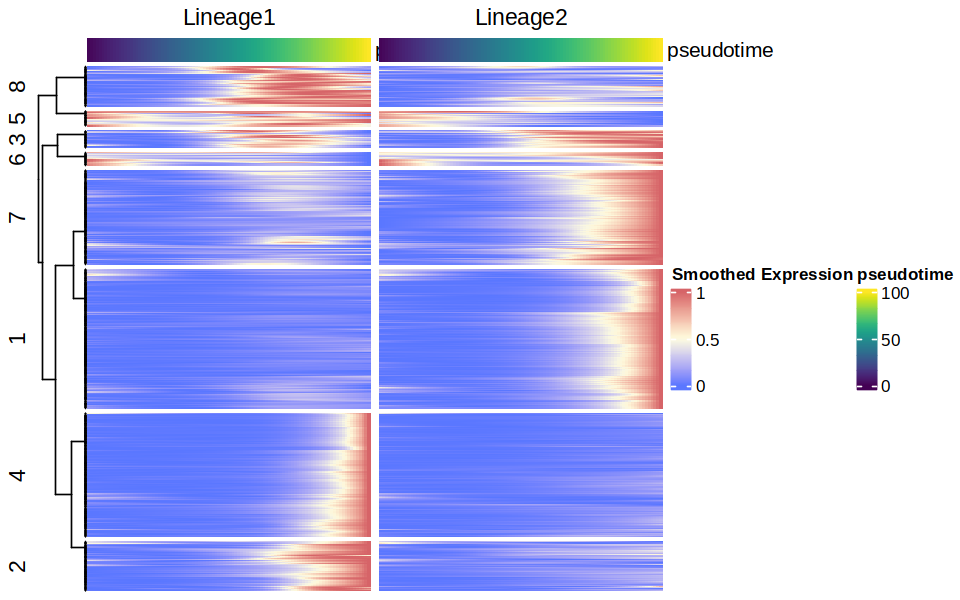

In [12]:
# Clustering
set.seed(42)
k = 8
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'Lineage1',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Lineage2',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [13]:
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

In [14]:
# Combine all into a single plot
group_levels = c(3,7,2,6,5,
                 4,8,1
                 )
smooth.dt = as.data.table(yhatSmooth, keep.rownames=F) %>% 
    .[,yhat := minmax(yhat), by='gene'] %>% 
    .[,trajectory := ifelse(lineage == '1', 'Trajectory1', 'Trajectory2')] %>%
    .[,trajectory := factor(trajectory, levels=c('Trajectory1', 'Trajectory2'))] %>% 
    merge(., 
          as.data.table(group, keep.rownames=T) %>% setnames('rn', 'gene'),
          by='gene') %>%
    setnames(c('yhat', 'time'), c('MinMax_Expr', 'pseudotime')) %>%
    .[,group := factor(group, levels = group_levels)]

mean.dt = smooth.dt %>% copy() %>% 
    .[,MinMax_Expr := mean(MinMax_Expr), by=c('group', 'trajectory', 'pseudotime')] %>% 
    unique(by=c('group', 'trajectory', 'pseudotime'))

nrow(smooth.dt)
nrow(mean.dt)

[1] 183400

[1] 1600

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


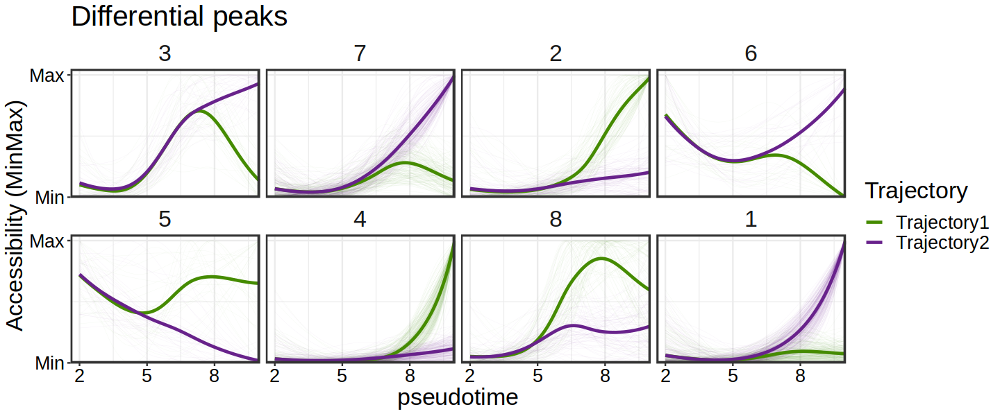

In [15]:
options(repr.plot.height=5, repr.plot.width=12)

p1 = ggplot(smooth.dt, aes(pseudotime, MinMax_Expr, col=trajectory, group.by=gene)) + 
    geom_line(alpha=0.05, size=0.1) +
    geom_line(data=mean.dt, size=1) + 
    scale_color_manual(values=c(Trajectory1='chartreuse4', Trajectory2='darkorchid4'), name='Trajectory') + 
 #   scale_color_manual(values=c('YS_traj' = 'black', 'Allantois_Traj' = 'red'), name='Trajectory') + 
    scale_x_continuous(expand=c(0.05,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0), breaks = c(0,1), labels = c('Min', 'Max')) + 
    facet_wrap(~group, ncol=4) + 
    ggtitle('Differential peaks') + 
    ylab('Accessibility (MinMax)') + 
    theme_bw() + 
    theme(strip.background=element_blank(),
          strip.text = element_text(size=20), 
        panel.border = element_rect(linewidth=1.2),
         text = element_text(size=20, color='black'),
         axis.text = element_text(color='black'))
p1

In [38]:
ArchRProject = suppressMessages(loadArchRProject(io$archR.directory))

args$vitro_bws = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/celltypeV2_genotype/')
# vitro_files = paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))

bigwigs.data_vitro = data.table(celltype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(1),
                    genotype = list.files(args$vitro_bws, 'bw') %>% str_split(., '\\.') %>% map_chr(2) %>% str_split('-') %>% map_chr(1),
                    path =  paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))) %>% 
                .[,name := paste0(celltype, '-', genotype)] %>% 
                .[,color := ifelse(genotype == 'KO', '#FF0000', '#000000')] %>% 
                .[name != 'Blood_Progenitor-KO']

bigwig_order = c('Allantois_Precursor',
                 'Posterior_Mes',
                 'Early_Mes_EOi',
                 'Primitive_Streak',
                 'Early_Mes_EOd',
                 'HE_Precursor',
                 'HE'
                )

WT_plot = bigwigs.data_vitro %>% copy() %>%
    .[genotype %in% c('WT', 'Atlas')] %>% 
    .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    .[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[, name := factor(name, levels = bigwig_order)]

In [39]:
peak_gene_correlation = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))

In [40]:
tmp = patternGenes[match(names(group), gene)] %>% copy() %>% .[,group := group] %>% setnames('gene', 'peak') %>% 
    merge(., peak_gene_correlation %>% setnames('padj', 'padj_corr'), by = 'peak')

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'merge': Object 'group' not found amongst gene, waldStat, df, pvalue, fcMedian and 2 more


In [363]:
source(here::here('utils.R'))

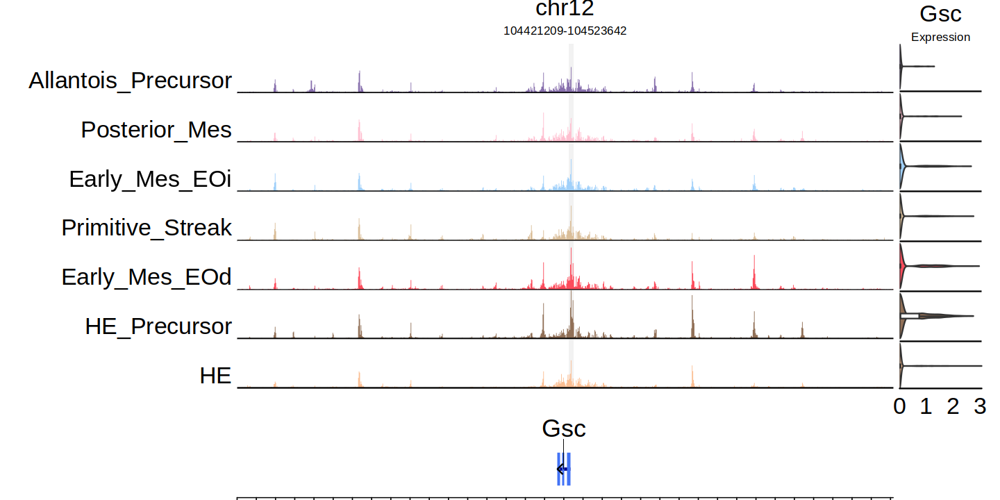

In [429]:
# Plot gene with peaks
input_gene = 'Gsc'

tmp1 = tmp[order(padj)][gene %in% c(input_gene)][padj_corr < 0.01]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 5e4,
                              extend.downstream = 5e4, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = 'grey95',
                              bw_height = 1.5, 
                              gene_height = 2.5,
                              bw_width = 20)

### Cluster motif enrichment

In [14]:
# Load ATAC data
ArchRProject <- suppressMessages(loadArchRProject(io$archR.directory))
args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')
atac.sce = readRDS(args$peakmtx)[, meta$cell]

In [20]:
ArchRProject@peakAnnotation

List of length 2
names(2): Motif_cisbp Motif_JASPAR2020

In [21]:
getPositions(ArchRProject, 'Motif_JASPAR2020')

GRangesList object of length 633:
$FOXF2_1
GRanges object with 18613 ranges and 1 metadata column:
          seqnames              ranges strand |     score
             <Rle>           <IRanges>  <Rle> | <numeric>
      [1]     chr1     3483238-3483251      + |   13.7858
      [2]     chr1     4282652-4282665      + |   12.0037
      [3]     chr1     4551084-4551097      + |   12.3119
      [4]     chr1     4613469-4613482      + |   15.3142
      [5]     chr1     4640991-4641004      - |   11.7562
      ...      ...                 ...    ... .       ...
  [18609]     chrX 167049708-167049721      + |   13.4463
  [18610]     chrX 169685082-169685095      - |   14.3452
  [18611]     chrX 169799212-169799225      - |   11.7871
  [18612]     chrX 169899643-169899656      - |   11.5767
  [18613]     chrX 169906659-169906672      + |   11.5988
  -------
  seqinfo: 20 sequences from an unspecified genome; no seqlengths

...
<632 more elements>

In [22]:
matches <- getMatches(ArchRProject, 'Motif_JASPAR2020')
rownames(matches) = rownames(atac.sce)

In [23]:
clust_enrichment = lapply(unique(group), function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, names(group[group == x]), seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[,group := factor(x, levels = group_levels)]
    return(tmp)
}) %>% rbindlist()

In [24]:
to.plot = as.data.table(clust_enrichment) %>% 
    .[,rank := seq_len(.N), by=group] %>% 
    .[mlog10Padj > -log10(0.05)]

In [25]:
options(repr.plot.height=7, repr.plot.width=15)
to.plot = as.data.table(clust_enrichment) %>% 
    .[,rank := seq_len(.N), by=group] %>% 
    .[mlog10Padj > -log10(0.05)]
p2 = ggplot(to.plot, aes(rank, mlog10Padj, color=mlog10Padj)) + 
    geom_point() +
    ggrepel::geom_text_repel(data = to.plot[, head(.SD, 7), by='group'], aes(label = feature),
                             box.padding = 0.1,
                           #  nudge_x = 4,
                            direction = "y",
                            vjust = .5,
                            hjust =-0.5,
                             size = 5,
                             color='black'
                            ) + 
    scale_x_continuous(expand=c(0.05,0, 0, 0)) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0)) + 
    facet_wrap(~group, ncol=4, scales='free') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size=20), 
          panel.border = element_rect(linewidth=1.2),
          axis.text = element_text(color='black'),
          legend.position = 'none')

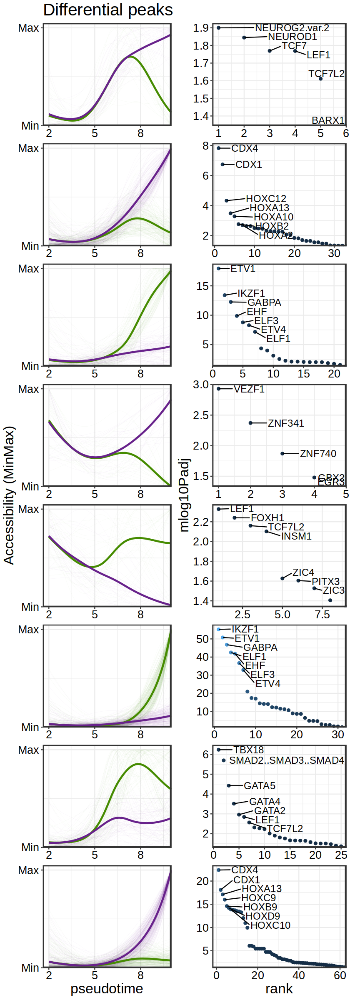

In [26]:
options(repr.plot.height=20, repr.plot.width=7)

ggarrange(
    p1+   facet_wrap(~group, ncol=1, scales='free') + theme(legend.position = 'none', strip.text = element_blank()),
    p2+   facet_wrap(~group, ncol=1, scales='free') + ggtitle('') + theme(strip.text = element_blank())
)


In [22]:
# In silicoChIP 
# From: 09_Eomes_invitro_blood/code/atac/archR/chromvar/silicoChIP_ChromVAR.ipynb

# CISBP in silico
# make dictionary of bed files from in silico ChIP
files = list.files('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/virtual_chipseq/pseudobulk/CISBP', pattern='.top_bed.gz')
files_dict = files
files_dict = paste0('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/virtual_chipseq/pseudobulk/CISBP/', files)
names(files_dict) = str_split(files, '\\.') %>% map_chr(1)

# Only testing now with motifs keep to keep chromvar quick
ArchRProject <- addPeakAnnotations(ArchRProj = ArchRProject, regions = files_dict, name = "silicoChIP_CISBP", force=T)

# JASPAR2020 in silico
# make dictionary of bed files from in silico ChIP
files = list.files('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/virtual_chipseq/pseudobulk/JASPAR', pattern='.top_bed.gz')
files_dict = files
files_dict = paste0('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/virtual_chipseq/pseudobulk/JASPAR/', files)
names(files_dict) = str_split(files, '\\.') %>% map_chr(1)

# Only testing now with motifs keep to keep chromvar quick
ArchRProject <- addPeakAnnotations(ArchRProj = ArchRProject, regions = files_dict, name = "silicoChIP_JASPAR", force=T)

ArchR logging to : ArchRLogs/ArchR-addPeakAnnotations-2a05b73229482-Date-2024-04-25_Time-11-21-00.log
If there is an issue, please report to github with logFile!

2024-04-25 11:21:37 : Creating Peak Overlap Matrix, 0.625 mins elapsed.

2024-04-25 11:21:38 : All Regions Overlap at least 1 peak!, 0.63 mins elapsed.

ArchR logging to : ArchRLogs/ArchR-addPeakAnnotations-2a05b71255e3c7-Date-2024-04-25_Time-11-21-38.log
If there is an issue, please report to github with logFile!

2024-04-25 11:22:03 : Creating Peak Overlap Matrix, 0.409 mins elapsed.

2024-04-25 11:22:03 : All Regions Overlap at least 1 peak!, 0.411 mins elapsed.



In [47]:
# matches <- getMatches(ArchRProject, 'silicoChIP_JASPAR')
# rownames(matches) = rownames(atac.sce)

In [16]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(jaspar_silico_chip, 'matches') = assay(jaspar_silico_chip, 'VirtualChipScores') > 0.20
assay(jaspar_silico_chip, 'motifScores') = NULL
assay(jaspar_silico_chip, 'motifMatches') = NULL
assay(jaspar_silico_chip, 'motifCounts') = NULL
assay(jaspar_silico_chip, 'VirtualChipScores') = NULL
matches = jaspar_silico_chip

In [49]:
summary(rownames(matches) == rownames(atac.sce))

   Mode    TRUE 
logical  234908 

In [50]:
clust_enrichment = lapply(unique(group), function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, names(group[group == x]), seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[,group := factor(x, levels = group_levels)]
    return(tmp)
}) %>% rbindlist()

In [51]:
options(repr.plot.height=7, repr.plot.width=15)
to.plot = as.data.table(clust_enrichment) %>% 
    .[,rank := seq_len(.N), by=group] %>% 
    .[mlog10Padj > -log10(0.05)]
p2 = ggplot(to.plot, aes(rank, mlog10Padj, color=mlog10Padj)) + 
    geom_point() +
    ggrepel::geom_text_repel(data = to.plot[, head(.SD, 7), by='group'], aes(label = feature),
                             box.padding = 0.1,
                           #  nudge_x = 4,
                            direction = "y",
                            vjust = .5,
                            hjust =-0.5,
                             size = 5,
                             color='black'
                            ) + 
    scale_x_continuous(expand=c(0.05,0, 0, 0)) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0)) + 
    facet_wrap(~group, ncol=4, scales='free') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size=20), 
          panel.border = element_rect(linewidth=1.2),
          axis.text = element_text(color='black'),
          legend.position = 'none')

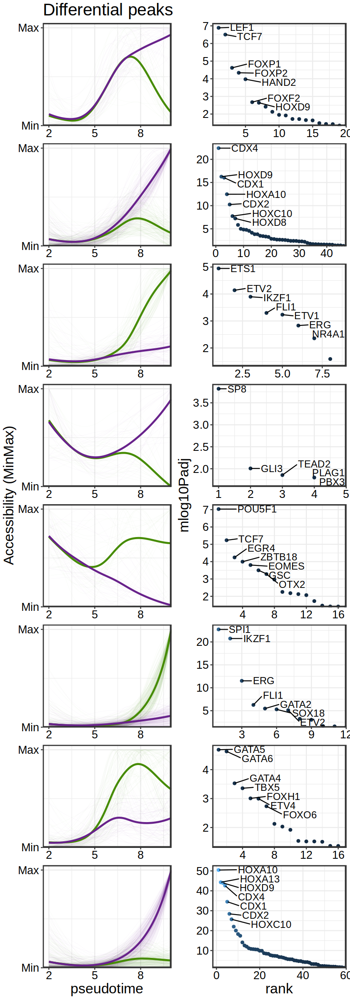

In [52]:
options(repr.plot.height=20, repr.plot.width=7)

ggarrange(
    p1+   facet_wrap(~group, ncol=1, scales='free') + theme(legend.position = 'none', strip.text = element_blank()),
    p2+   facet_wrap(~group, ncol=1, scales='free') + ggtitle('') + theme(strip.text = element_blank())
)


In [53]:
# matches <- getMatches(ArchRProject, 'silicoChIP_CISBP')
# rownames(matches) = rownames(atac.sce)

In [17]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
cisbp_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(cisbp_silico_chip, 'matches') = assay(cisbp_silico_chip, 'VirtualChipScores') > 0.20
assay(cisbp_silico_chip, 'motifScores') = NULL
assay(cisbp_silico_chip, 'motifMatches') = NULL
assay(cisbp_silico_chip, 'motifCounts') = NULL
assay(cisbp_silico_chip, 'VirtualChipScores') = NULL
matches = cisbp_silico_chip

In [55]:
clust_enrichment = lapply(unique(group), function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, names(group[group == x]), seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[,group := factor(x, levels = group_levels)]
    return(tmp)
}) %>% rbindlist()

In [56]:
options(repr.plot.height=7, repr.plot.width=15)
to.plot = as.data.table(clust_enrichment) %>% 
    .[,rank := seq_len(.N), by=group] %>% 
    .[mlog10Padj > -log10(0.05)]
p2 = ggplot(to.plot, aes(rank, mlog10Padj, color=mlog10Padj)) + 
    geom_point() +
    ggrepel::geom_text_repel(data = to.plot[, head(.SD, 7), by='group'], aes(label = feature),
                             box.padding = 0.1,
                           #  nudge_x = 4,
                            direction = "y",
                            vjust = .5,
                            hjust =-0.5,
                             size = 5,
                             color='black'
                            ) + 
    scale_x_continuous(expand=c(0.05,0, 0, 0)) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0)) + 
    facet_wrap(~group, ncol=4, scales='free') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size=20), 
          panel.border = element_rect(linewidth=1.2),
          axis.text = element_text(color='black'),
          legend.position = 'none')

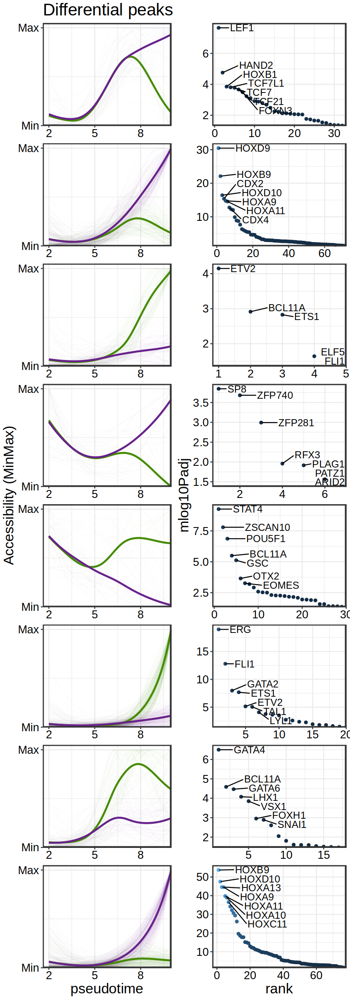

In [57]:
options(repr.plot.height=20, repr.plot.width=7)

ggarrange(
    p1+   facet_wrap(~group, ncol=1, scales='free') + theme(legend.position = 'none', strip.text = element_blank()),
    p2+   facet_wrap(~group, ncol=1, scales='free') + ggtitle('') + theme(strip.text = element_blank())
)


In [58]:
yhatSmooth <- predictSmooth(sceGAM, gene = 'Mesp1', nPoints = 100, tidy=TRUE)

ERROR: Error in .local(models, ...): Not all gene IDs are present in the models object.


In [ ]:
options(repr.plot.height=3, repr.plot.width=3)
    #genes = c('chr1:24453066-24453666')
    genes = 'Mesp1'
p = ggplot(yhatSmooth[yhatSmooth$gene == genes,], aes(time, yhat, color=as.character(lineage))) + 
           # geom_point(size=1, alpha=1) +
            geom_line() + 
            scale_color_manual(values=c('1'='chartreuse4', '2'='darkorchid4'), name='Trajectory') + 
            scale_x_continuous(expand=c(0,0), breaks=c(0, 3, 6, 9, 12)) + 
            scale_y_continuous(expand=c(0,0), breaks=seq(0, 10, 0.5)) + 
       #     geom_smooth(se = T) +
            geom_hline(yintercept=0) +
          #  facet_wrap(~Var1, ncol=8, scales='free_y') + 
            theme_bw() + 
            theme(strip.background = element_blank(),
                  text = element_text(size=20),
                  axis.text = element_text(color='black'),
                  axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                  axis.text.y = element_blank(),
                  legend.position='none')
    print(p)


### Clustering on all peaks linked to differential genes

In [66]:
suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(ComplexHeatmap))

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')
cols <- trans(seq(0,1, length.out=20))
col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy = FALSE) # [!rownames(sceGAM) %in% genes_keep]
  
# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage2', colnames(yhatSmooth_minmax))]

Warning message:
“did not converge in 10 iterations”
`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



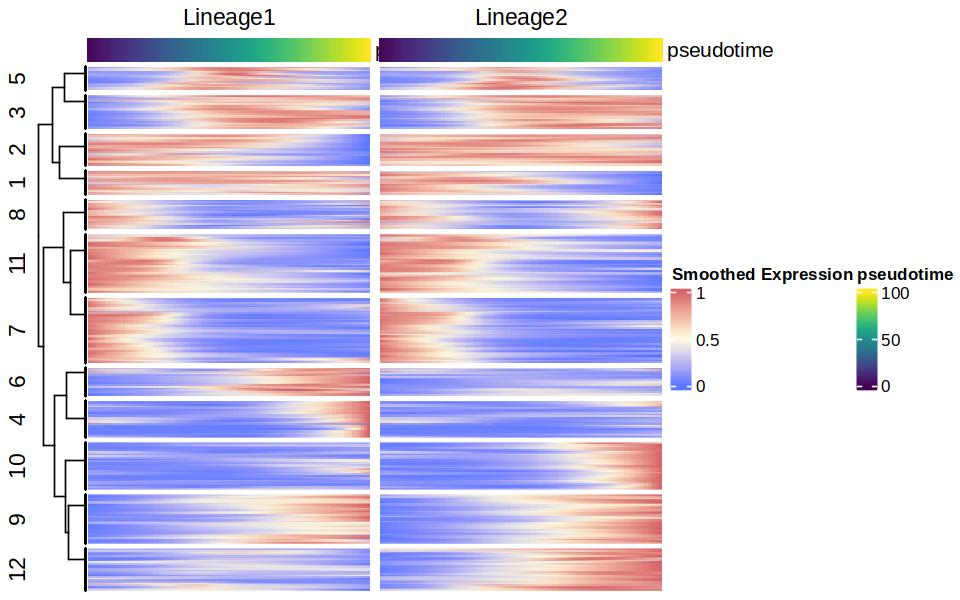

In [67]:
# Clustering
set.seed(42)
k = 12
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'Lineage1',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Lineage2',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

### Linking RNA & ATAC

In [19]:
# Load trajectory analysis
patternGenes = fread(file.path(args$outdir, 'patternGenes.txt.gz'))
endGenes = fread(file.path(args$outdir, 'endGenes.txt.gz'))
genes_keep = unique(rbind(patternGenes[,c('gene', 'waldStat', 'padj', 'sig')], endGenes[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)

patternGenes_ATAC = fread(file.path(args$outdir, 'patternGenes_ATAC.txt.gz'))
endGenes_ATAC = fread(file.path(args$outdir, 'endGenes_ATAC.txt.gz'))
peaks_keep = unique(rbind(patternGenes_ATAC[,c('gene', 'waldStat', 'padj', 'sig')], endGenes_ATAC[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)

sceGAM = readRDS(file.path(args$outdir, 'sceGAM.rds'))
sceGAM_ATAC = readRDS(file.path(args$outdir, 'sceGAM_ATAC.rds'))

# Load peak gene correlations
peak_gene_correlation = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))

# Load ATAC data
ArchRProject <- suppressMessages(loadArchRProject(io$archR.directory))
args$peakmtx = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds')
atac.sce = readRDS(args$peakmtx)[, meta$cell]

# Get silico Chip
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
cisbp_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(cisbp_silico_chip, 'matches') = assay(cisbp_silico_chip, 'VirtualChipScores') > 0.20
assay(cisbp_silico_chip, 'motifScores') = NULL
assay(cisbp_silico_chip, 'motifMatches') = NULL
assay(cisbp_silico_chip, 'motifCounts') = NULL
assay(cisbp_silico_chip, 'VirtualChipScores') = NULL
matches = cisbp_silico_chip

jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(jaspar_silico_chip, 'matches') = assay(jaspar_silico_chip, 'VirtualChipScores') > 0.20
assay(jaspar_silico_chip, 'motifScores') = NULL
assay(jaspar_silico_chip, 'motifMatches') = NULL
assay(jaspar_silico_chip, 'motifCounts') = NULL
assay(jaspar_silico_chip, 'VirtualChipScores') = NULL
matches = jaspar_silico_chip

In [21]:
# Less stringent differential testing for ATAC-seq
patternRes <- patternTest(sceGAM_ATAC, l2fc=0.25) # Perform pattern testing with set l2fc
patternGenes_ATAC = patternRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(patternGenes_ATAC[sig==TRUE])

endRes <- diffEndTest(sceGAM_ATAC, l2fc=0.25) # Perform pattern testing with set l2fc
endGenes_ATAC = endRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(endGenes_ATAC[sig==TRUE])

peaks_keep = unique(rbind(patternGenes_ATAC[,c('gene', 'waldStat', 'padj', 'sig')], endGenes_ATAC[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)

[1] 394

[1] 814

In [22]:
yhatSmooth <- as.data.table(predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy=TRUE))
yhatSmooth_ATAC <- as.data.table(predictSmooth(sceGAM_ATAC, gene = rownames(sceGAM_ATAC), nPoints = 100, tidy=TRUE))

In [23]:
plot_gene_regulation = function(gene_input, collapse = T, return_plot=T){
    rna.tmp = yhatSmooth[gene %in% gene_input,] %>% 
        .[,modality := 'RNA'] %>% # Add a column indicating the modality
        .[, name := paste0(gene_input, collapse='/')] # Add column with gene names
    atac.tmp = yhatSmooth_ATAC[gene %in% peak_gene_correlation[gene %in% gene_input & padj<0.05, peak],] %>% #  & peak %in% genes_keep[padj<=0.3, gene]
        .[gene %in% peaks_keep] %>% # keep only peaks differential between the two lineages
         .[,modality := 'ATAC'] %>% # Add a column indicating the modality
        # Add peak gene correlation data, only keep significant & positive peaks
         merge(., peak_gene_correlation[gene %in% gene_input & padj<0.05 & cor > 0, c('peak', 'distance', 'cor', 'padj')] %>% 
                   .[order(padj)] %>% 
                   .[!duplicated(peak)],  # Remove duplicate peaks that are regulating multiple genes
                by.x='gene', by.y = 'peak') %>%
        .[, name := paste0(gene, '\nDistance: ', distance, ' bp,\nCor: ', cor)] %>% # Add column with peak information
        .[order(distance)] %>% .[, name := factor(name, levels = unique(name))] %>% # Add factors for visualisation
        .[,c('distance', 'cor', 'padj') := NULL]

    # Create one data.table with both RNA & ATAC
    combined = rbind(rna.tmp, atac.tmp) %>% 
        .[,lineage2 := as.character(paste0(lineage, modality))] %>%
        .[,yhat_minmax := minmax.normalisation(yhat), by='gene'] %>% 
        .[order(time)] %>%
        .[]

    if(return_plot){
        if(collapse){
            p1 = ggplot(combined, aes(time, yhat_minmax, color = as.character(lineage), group.by = gene, size = modality, alpha = modality)) + 
                        geom_line() + 
                        scale_size_manual(values = c('RNA' = 1, 'ATAC' = 0.2)) + 
                        scale_alpha_manual(values = c('RNA' = 1, 'ATAC' = 0.4)) + 
                        # scale_color_manual(values=c('1RNA'='chartreuse4', '2RNA'='darkorchid4',
                        #                            '1ATAC'='chartreuse3', '2ATAC'='darkorchid3'), name='Trajectory') + 
                        scale_color_manual(values=c('1'='chartreuse4', '2'='darkorchid4'), name='Trajectory') + 
                        scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
                        scale_y_continuous(expand=c(0,0, 0.05, 0), breaks=c(0,1), labels = c('Min', 'Max')) + 
                        geom_hline(yintercept=0) +
                    #    facet_wrap(~modality, ncol=1, scales = 'free') + 
                        facet_wrap(~lineage) + 
                        ggtitle(paste0(gene_input, collapse='/')) + 
                        ylab('Expr/Acc levels') + 
                        xlab('Pseudotime') + 
                        theme_bw() + 
                        theme(strip.background = element_blank(),
                              strip.text = element_blank(), 
                              text = element_text(size=20),
                              axis.text = element_text(color='black'),
                              axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                              axis.text.y = element_text(),
                              legend.position='right')

            options(repr.plot.height=3.5, repr.plot.width=8)

        }else{    
            p1 = ggplot(combined, aes(time, yhat_minmax, color = as.character(lineage), group.by = gene, size = modality, alpha = modality)) + 
                    geom_line() + 
                    scale_size_manual(values = c('RNA' = 1, 'ATAC' = 0.8)) + 
                    scale_alpha_manual(values = c('RNA' = 1, 'ATAC' = 0.4)) + 
                    # scale_color_manual(values=c('1RNA'='chartreuse4', '2RNA'='darkorchid4',
                    #                            '1ATAC'='chartreuse3', '2ATAC'='darkorchid3'), name='Trajectory') + 
                    scale_color_manual(values=c('1'='chartreuse4', '2'='darkorchid4'), name='Trajectory') + 
                    scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
                    scale_y_continuous(expand=c(0,0, 0.05, 0), breaks=c(0,1), labels = c('Min', 'Max')) + 
                    geom_hline(yintercept=0) +
                #    facet_wrap(~modality, ncol=1, scales = 'free') + 
                    facet_grid(rows = vars(name)) +
                    ylab('Expr/Acc levels') + 
                    xlab('Pseudotime') + 
                    theme_bw() + 
                    theme(strip.background = element_blank(),
                          strip.text.y = element_text(angle=0, color='black', hjust=0),
                          text = element_text(size=20),
                          axis.text = element_text(color='black'),
                          axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                          axis.text.y = element_text(),
                          legend.position='none')

            options(repr.plot.height=(length(unique(combined$gene))+1)*2, repr.plot.width=6.55)
        }
    
        return(p1)
    }
    else{return(combined)}
}

In [24]:
plot_residuals = function(peak){
    residual = rbind(combined %>% copy() %>% .[order(time)] %>%
            .[lineage == '1'] %>% 
            .[gene == peak, ] %>% 
          #  .[, residual := (yhat_minmax - combined[modality == 'RNA' & lineage == '1', yhat_minmax]) * combined[modality == 'RNA' & lineage == '1', yhat_minmax]],
           .[, residual := yhat_minmax - combined[modality == 'RNA' & lineage == '1', yhat_minmax]],
        combined %>% copy() %>% .[order(time)] %>%
            .[lineage == '2'] %>% 
            .[gene == peak, ] %>% 
          #  .[, residual := (yhat_minmax - combined[modality == 'RNA' & lineage == '1', yhat_minmax]) * combined[modality == 'RNA' & lineage == '2', yhat_minmax]]
            .[, residual := yhat_minmax - combined[modality == 'RNA' & lineage == '2', yhat_minmax]]
    )
                     
    
    p = ggplot(residual, aes(time, residual, color= as.character(lineage))) + 
                geom_line() + 
                scale_size_manual(values = c('RNA' = 1, 'ATAC' = 0.8)) + 
                scale_alpha_manual(values = c('RNA' = 1, 'ATAC' = 0.4)) + 
                # scale_color_manual(values=c('1RNA'='chartreuse4', '2RNA'='darkorchid4',
                #                            '1ATAC'='chartreuse3', '2ATAC'='darkorchid3'), name='Trajectory') + 
                scale_color_manual(values=c('1'='chartreuse4', '2'='darkorchid4'), name='Trajectory') + 
                # scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
                xlim(2, 13) + 
               # scale_y_continuous(expand=c(0,0, 0.05, 0), breaks=c(-1, 0,1), labels = c('-Max', 'Min', 'Max')) + 
                geom_hline(yintercept=0) +
               # ggtitle(unique(residual$name)) + 
            #    facet_wrap(~modality, ncol=1, scales = 'free') + 
                ylab('Peak-gene residual') + 
                xlab('Pseudotime') + 
                theme_bw() + 
                theme(strip.background = element_blank(),
                      strip.text.y = element_text(angle=0, color='black', hjust=0),
                      text = element_text(size=20),
                      axis.text = element_text(color='black'),
                      axis.text.x = element_text(angle=-45, hjust=0, vjust=1),
                      axis.text.y = element_text(),
                      legend.position='none')
    return(p)
}

In [25]:
plot_motifs = function(gene, motifannotation, ntop = 12, return_df = F){
    if(motifannotation == 'cisbp_silico_chip'){
        matches = cisbp_silico_chip
    }else if(motifannotation == 'jaspar_silico_chip'){
        matches = jaspar_silico_chip
    }else{
        matches <- getMatches(ArchRProject, motifannotation)
    }
        
    rownames(matches) = rownames(atac.sce)

    clust_enrichment = as.data.table(ArchR:::.computeEnrichment(matches, unique(plot_gene_regulation(gene, return_plot=F)[modality=='ATAC',gene]), seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)]

    to.plot = as.data.table(clust_enrichment) %>% 
        .[,rank := seq_len(.N)] %>% 
        .[mlog10Padj > -log10(0.05)]
    options(repr.plot.height=7, repr.plot.width=15)
    to.plot = as.data.table(clust_enrichment) %>% 
        .[,rank := seq_len(.N)] %>% 
        .[mlog10Padj > -log10(0.05)]

    p = ggplot(head(to.plot, ntop), aes(rank, mlog10Padj)) + 
            geom_bar(stat='identity', color='black', fill='black') +
            geom_text(aes(label = feature),  #[, head(.SD, 7), by='group']
                                    vjust = 0.5,
                                    hjust =-0.1,
                                     size = 5,
                                     color='black', 
                                      angle=90
                                    ) + 
            scale_x_continuous(expand=c(0.03,0, 0.03, 0)) + 
            scale_y_continuous(expand=c(0,0, 0.5, 0)) + 
            ggtitle(motifannotation) + 
            theme_bw() + 
            theme(strip.background = element_blank(),
                  text = element_text(size=20),
                  strip.text = element_text(size=20), 
                  panel.border = element_rect(linewidth=1.2),
                  axis.text = element_text(color='black'),
                  panel.grid = element_blank(),
                  legend.position = 'none')
    if(return_df){
        return(clust_enrichment)
    }else{return(p)}
}

[1] "Etv2"                   "chr7:30638958-30639558" "chr7:30760088-30760688"

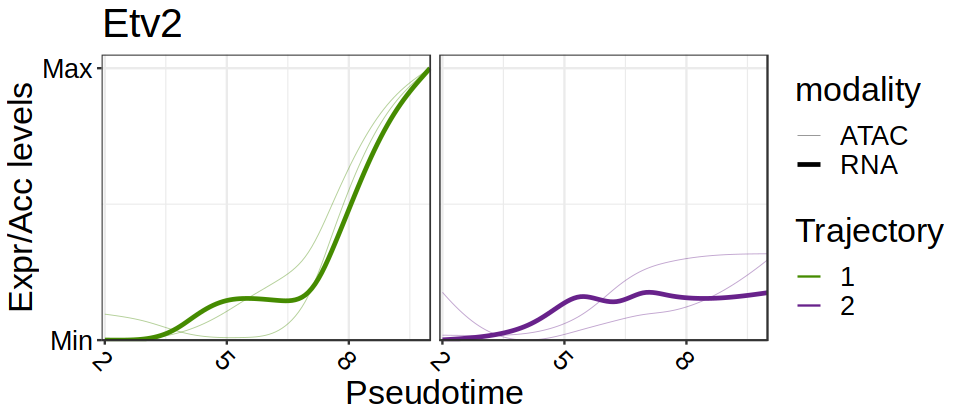

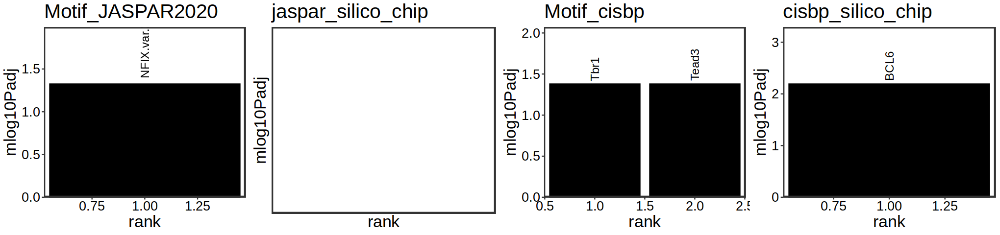

In [26]:
gene = 'Etv2' 
unique(plot_gene_regulation(gene, return_plot=F)$gene)
plot_gene_regulation(gene)
p = list()
p[[1]] = plot_motifs(gene, 'Motif_JASPAR2020')
p[[2]] = plot_motifs(gene, 'jaspar_silico_chip')
p[[3]] = plot_motifs(gene, 'Motif_cisbp')
p[[4]] = plot_motifs(gene, 'cisbp_silico_chip')

options(repr.plot.height=4, repr.plot.width=17)
ggarrange(plotlist = p, ncol=4)


In [ ]:
plot_gene_regulation(gene, collapse=F)

In [20]:
# Order genes by most enhancers
genes = genes_keep
enhancer_count = mclapply(genes, function(x){
    tmp = length(unique(plot_gene_regulation(x, return_plot=F)$gene))
    #return(tmp)
}, mc.cores = 12)
names(enhancer_count) = genes
enhancer_count = unlist(enhancer_count)
enhancer_count = enhancer_count[order(-enhancer_count)]

In [20]:
for(gene in head(names(enhancer_count), 50)){
    p = list()
    p[[1]] = plot_gene_regulation(gene) + theme(legend.position='none')
    p[[2]] = plot_motifs(gene, 'Motif_JASPAR2020')
    p[[3]] = plot_motifs(gene, 'silicoChIP_JASPAR') + theme(axis.title.y = element_blank())
    p[[4]] = plot_motifs(gene, 'Motif_cisbp') + theme(axis.title.y = element_blank())
    p[[5]] = plot_motifs(gene, 'silicoChIP_CISBP') + theme(axis.title.y = element_blank())
    p[[6]] = plot_motifs(gene, 'cisbp_silico_chip') + theme(axis.title.y = element_blank())

    options(repr.plot.height=4, repr.plot.width=23)
    print(ggarrange(plotlist = p, ncol=6, widths = c(2,1,1,1,1,1)))
}

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'enhancer_count' not found


In [ ]:
for(gene in c('Eomes', 'Mixl1', 'Etv2', 'Kdr')){
    p = list()
    p[[1]] = plot_gene_regulation(gene) + theme(legend.position='none')
    p[[2]] = plot_motifs(gene, 'Motif_JASPAR2020')
    p[[3]] = plot_motifs(gene, 'silicoChIP_JASPAR') + theme(axis.title.y = element_blank())
    p[[4]] = plot_motifs(gene, 'Motif_cisbp') + theme(axis.title.y = element_blank())
    p[[5]] = plot_motifs(gene, 'silicoChIP_CISBP') + theme(axis.title.y = element_blank())

    options(repr.plot.height=4, repr.plot.width=23)
    print(ggarrange(plotlist = p, ncol=5, widths = c(2,1,1,1,1)))
}

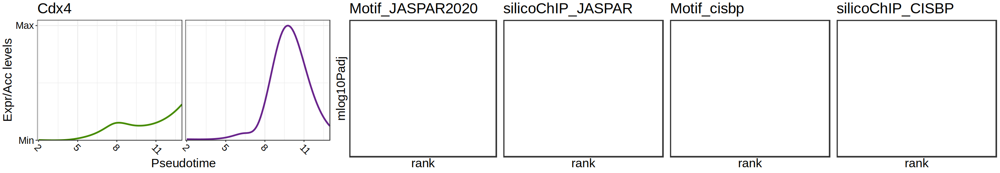

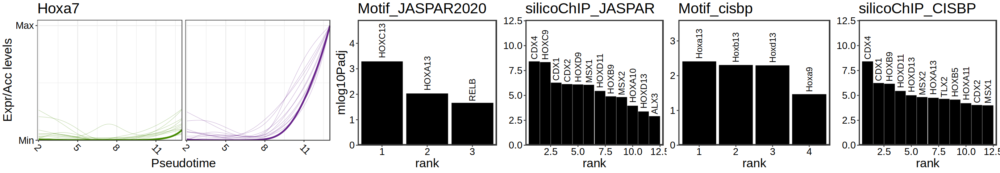

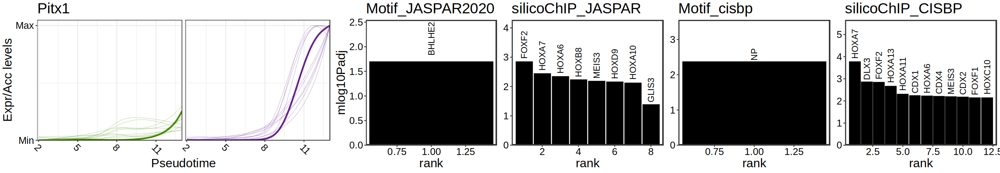

In [416]:
for(gene in c('Cdx4', 'Hoxa7', 'Pitx1')){
    if(gene %in% genes_keep){
        p = list()
        p[[1]] = plot_gene_regulation(gene) + theme(legend.position='none')
        p[[2]] = plot_motifs(gene, 'Motif_JASPAR2020')
        p[[3]] = plot_motifs(gene, 'silicoChIP_JASPAR') + theme(axis.title.y = element_blank())
        p[[4]] = plot_motifs(gene, 'Motif_cisbp') + theme(axis.title.y = element_blank())
        p[[5]] = plot_motifs(gene, 'silicoChIP_CISBP') + theme(axis.title.y = element_blank())

        options(repr.plot.height=4, repr.plot.width=23)
        print(ggarrange(plotlist = p, ncol=5, widths = c(2,1,1,1,1)))
    }
}

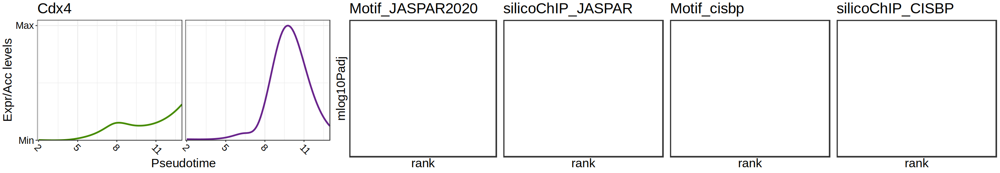

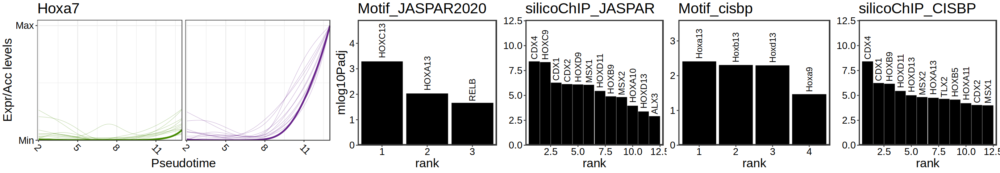

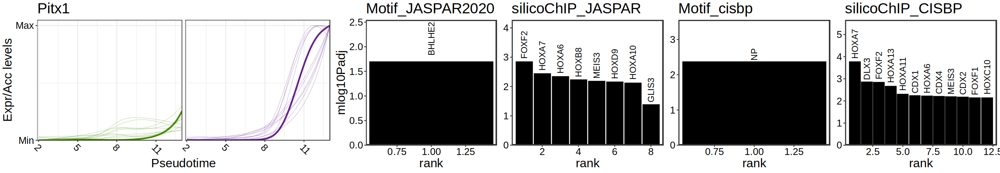

In [416]:
for(gene in c('Otx1', 'Lhx8', 'Insm1')){
    if(gene %in% genes_keep){
        p = list()
        p[[1]] = plot_gene_regulation(gene) + theme(legend.position='none')
        p[[2]] = plot_motifs(gene, 'Motif_JASPAR2020')
        p[[3]] = plot_motifs(gene, 'silicoChIP_JASPAR') + theme(axis.title.y = element_blank())
        p[[4]] = plot_motifs(gene, 'Motif_cisbp') + theme(axis.title.y = element_blank())
        p[[5]] = plot_motifs(gene, 'silicoChIP_CISBP') + theme(axis.title.y = element_blank())

        options(repr.plot.height=4, repr.plot.width=23)
        print(ggarrange(plotlist = p, ncol=5, widths = c(2,1,1,1,1)))
    }
}

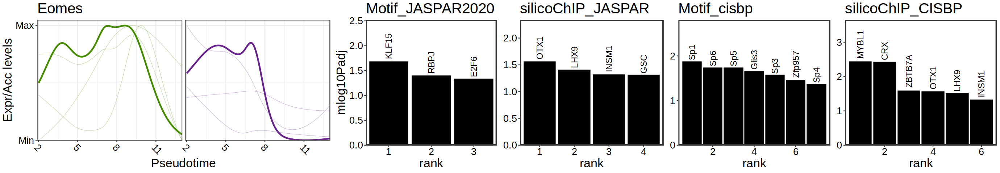

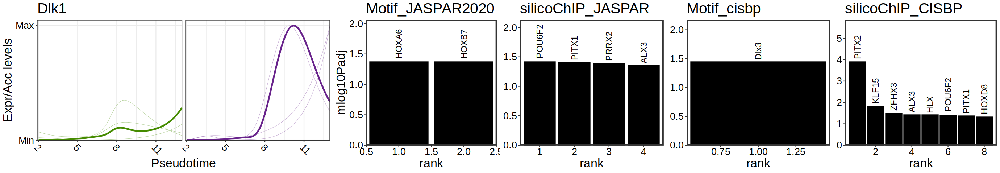

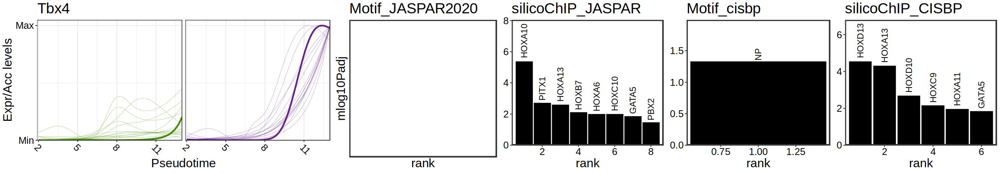

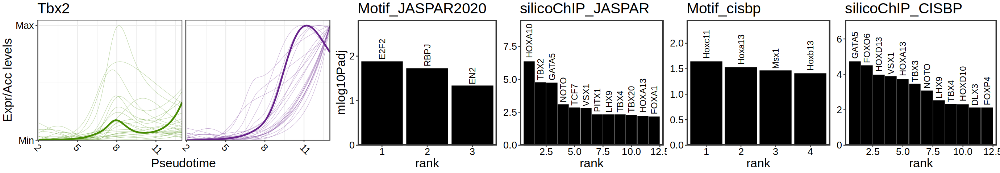

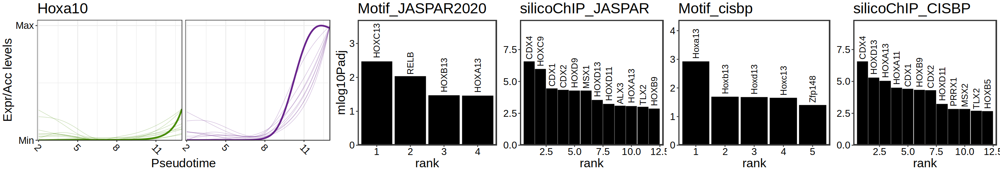

In [411]:
for(gene in c('Eomes', 'Dlk1', 'Tbx4', 'Tbx2', 'Hoxa10')){
    p = list()
    p[[1]] = plot_gene_regulation(gene) + theme(legend.position='none')
    p[[2]] = plot_motifs(gene, 'Motif_JASPAR2020')
    p[[3]] = plot_motifs(gene, 'silicoChIP_JASPAR') + theme(axis.title.y = element_blank())
    p[[4]] = plot_motifs(gene, 'Motif_cisbp') + theme(axis.title.y = element_blank())
    p[[5]] = plot_motifs(gene, 'silicoChIP_CISBP') + theme(axis.title.y = element_blank())

    options(repr.plot.height=4, repr.plot.width=23)
    print(ggarrange(plotlist = p, ncol=5, widths = c(2,1,1,1,1)))
}

In [27]:
yhatSmooth_RNA <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_RNA_minmax = t(apply(yhatSmooth_RNA, 1, minmax)) 

WT = yhatSmooth_RNA_minmax[, grepl('lineage1', colnames(yhatSmooth_RNA_minmax))]
KO = yhatSmooth_RNA_minmax[, grepl('lineage2', colnames(yhatSmooth_RNA_minmax))]

# Clustering
set.seed(42)
k = 8
group = kmeans(yhatSmooth_RNA_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_RNA_minmax), group)

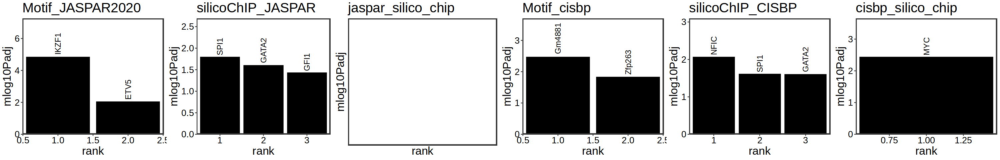

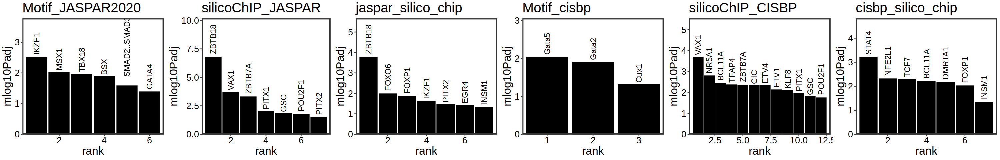

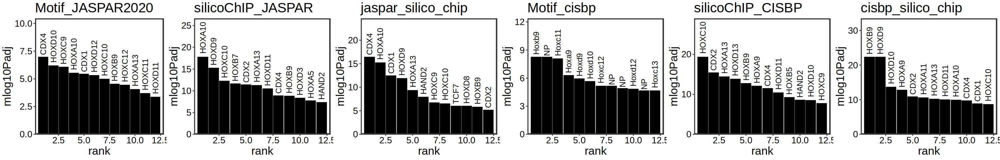

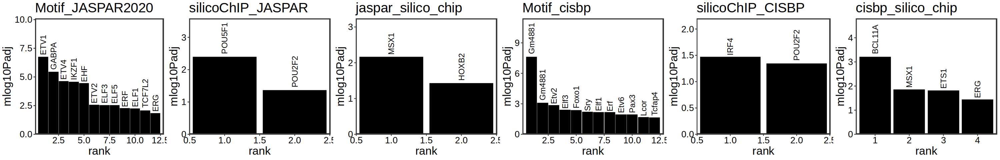

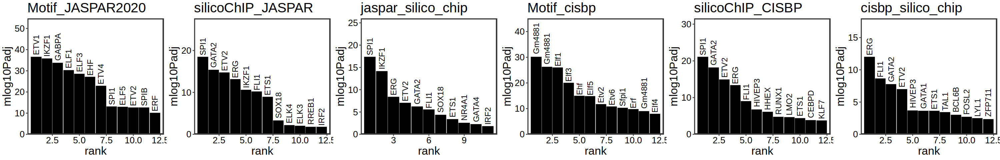

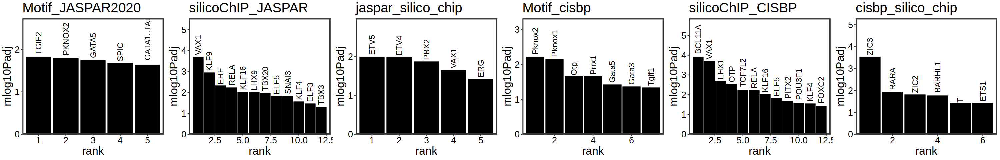

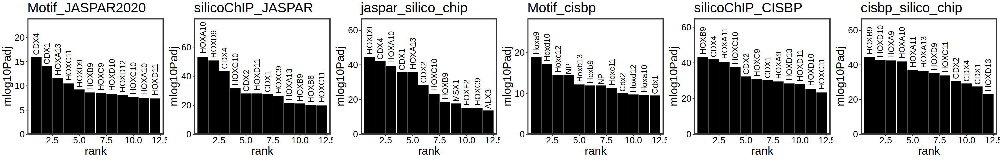

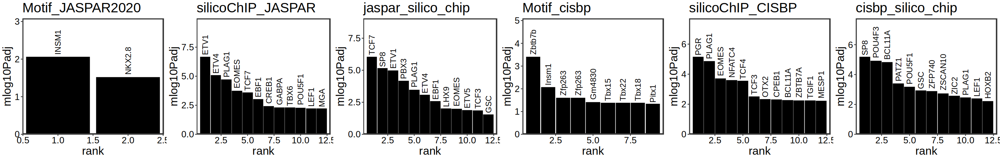

In [28]:
for(i in 1:8){
    gene = names(group)[group==i]
    #plot_gene_regulation(gene)
    p = list()
    p[[1]] = plot_motifs(gene, 'Motif_JASPAR2020')
    p[[2]] = plot_motifs(gene, 'silicoChIP_JASPAR')
    p[[3]] = plot_motifs(gene, 'jaspar_silico_chip')
    p[[4]] = plot_motifs(gene, 'Motif_cisbp')
    p[[5]] = plot_motifs(gene, 'silicoChIP_CISBP')
    p[[6]] = plot_motifs(gene, 'cisbp_silico_chip')


    options(repr.plot.height=4, repr.plot.width=25)
    print(ggarrange(plotlist = p, ncol=6))
}

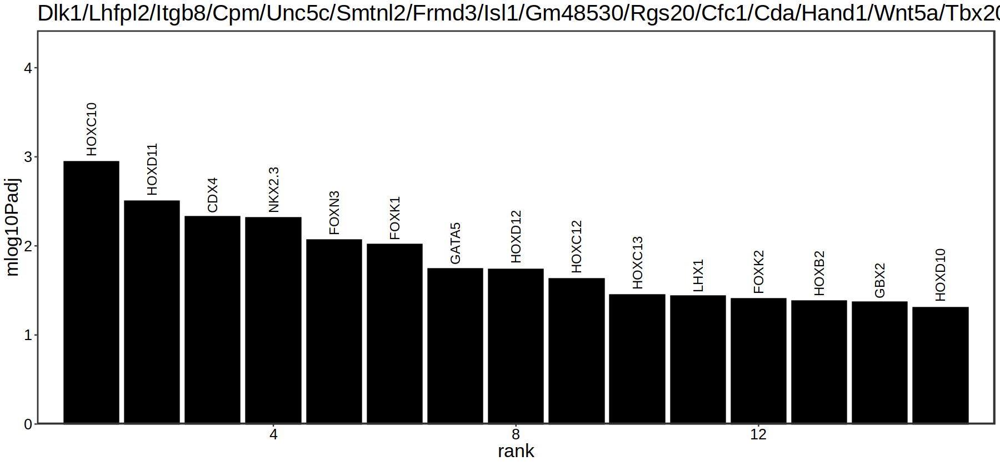

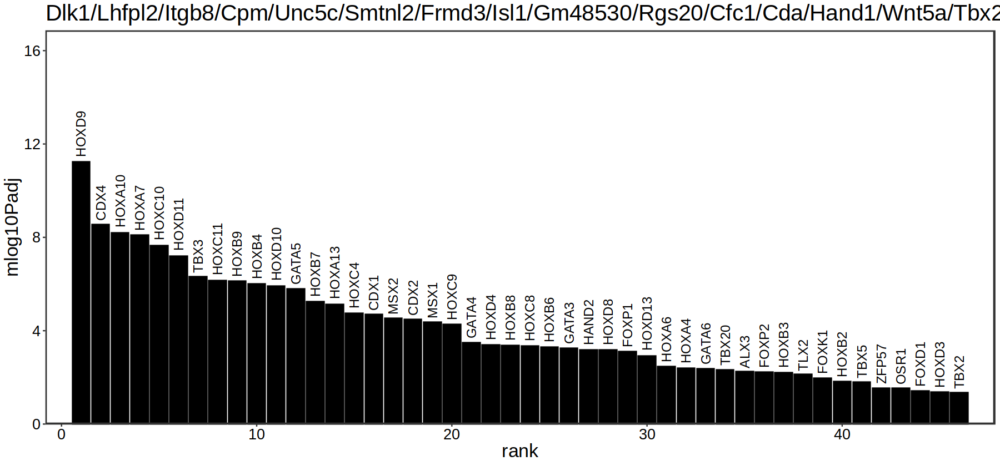

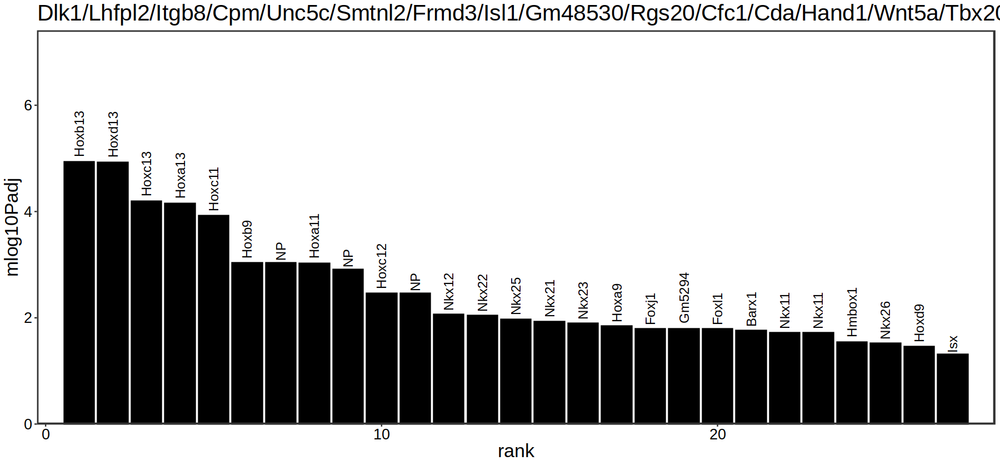

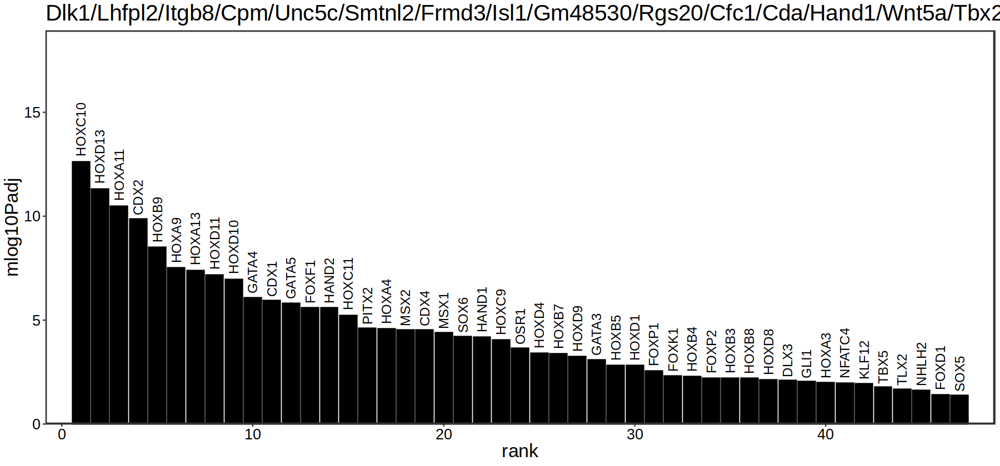

In [270]:
gene = names(group)[group==8]
options(repr.plot.height=4, repr.plot.width=30)
plot_motifs(gene, 'Motif_JASPAR2020', ntop = 100)
plot_motifs(gene, 'silicoChIP_JASPAR', ntop = 100)
plot_motifs(gene, 'Motif_cisbp', ntop = 100)
plot_motifs(gene, 'silicoChIP_CISBP', ntop = 100)

## ATAC - All peaks instead of only ones linked to genes

Output from 09_Eomes_invitro_blood/code/rna_atac/trajectory/v3/01_tradeSeq_ATAC_all_peaks.R

In [514]:
meta2 = rbind(meta[cell %in% Traj_assignment[Trajectory1==1, cell]] %>% 
                  .[, trajectory := 'Traj1'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_1],
              meta[cell %in% Traj_assignment[Trajectory2==1, cell]] %>%
                  .[, trajectory := 'Traj2'] %>%
                  .[, pseudotime := colData(rna.sce[,cell])$slingPseudotime_2])

In [19]:
sceGAM = readRDS(file.path(args$outdir, 'sceGAM_ATAC_all_peaks.rds'))

In [ ]:
patternRes <- patternTest(sceGAM, l2fc=0.25) # Perform pattern testing with set l2fc
patternGenes = patternRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(patternGenes[sig==TRUE])

In [ ]:
endRes <- diffEndTest(sceGAM, l2fc=0.25) # Perform pattern testing with set l2fc
endGenes = endRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(endGenes[sig==TRUE])

In [33]:
fwrite(patternGenes, file.path(args$outdir, 'patternGenes_ATAC_all_peaks.txt.gz'))
fwrite(endGenes, file.path(args$outdir, 'endGenes_ATAC_all_peaks.txt.gz'))

In [20]:
patternGenes = fread(file.path(args$outdir, 'patternGenes_ATAC_all_peaks.txt.gz'))
endGenes = fread(file.path(args$outdir, 'endGenes_ATAC_all_peaks.txt.gz'))

In [21]:
genes_keep = unique(rbind(patternGenes[,c('gene', 'waldStat', 'padj', 'sig')], endGenes[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)
length(genes_keep)

[1] 10221

In [23]:
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

In [24]:
suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(ComplexHeatmap))

trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')
cols <- trans(seq(0,1, length.out=20))
col_fun = colorRamp2(seq(0, 100, 5), viridis::viridis(length(seq(0, 100, 5))))
ha = HeatmapAnnotation(pseudotime = 1:100,
                       col = list(pseudotime = col_fun))

yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

WT = yhatSmooth_minmax[, grepl('lineage1', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('lineage2', colnames(yhatSmooth_minmax))]

[1] 2044200

[1] 2000

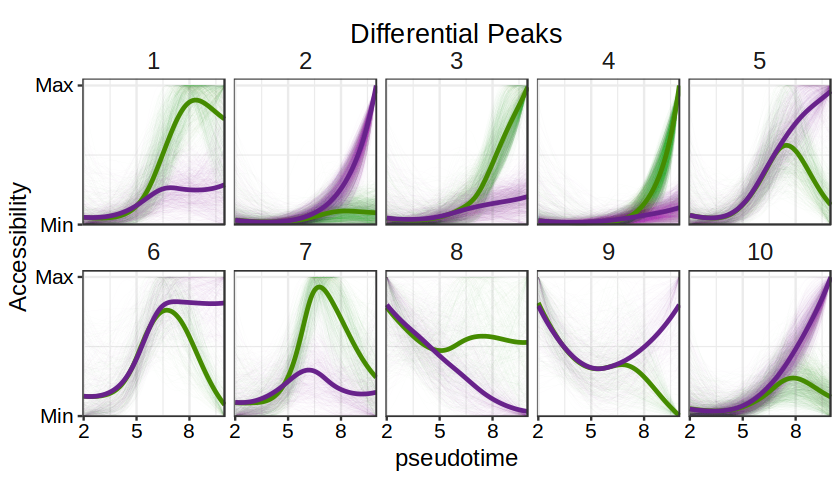

In [48]:
# Clustering
set.seed(1)
k = 10
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

group_levels = 1:10
smooth.dt = as.data.table(yhatSmooth, keep.rownames=F) %>% 
    .[,yhat := minmax(yhat), by='gene'] %>% 
    .[,trajectory := ifelse(lineage == '1', 'Trajectory1', 'Trajectory2')] %>%
    .[,trajectory := factor(trajectory, levels=c('Trajectory1', 'Trajectory2'))] %>% 
    merge(., 
          as.data.table(group, keep.rownames=T) %>% setnames('rn', 'gene'),
          by='gene') %>%
    setnames(c('yhat', 'time'), c('MinMax_Expr', 'pseudotime')) %>%
    .[,group := factor(group, levels = group_levels)]

mean.dt = smooth.dt %>% copy() %>% 
    .[,MinMax_Expr := mean(MinMax_Expr), by=c('group', 'trajectory', 'pseudotime')] %>% 
    unique(by=c('group', 'trajectory', 'pseudotime'))

nrow(smooth.dt)
nrow(mean.dt)

options(repr.plot.height=4, repr.plot.width=7)

p1 = ggplot(smooth.dt, aes(pseudotime, MinMax_Expr, col=trajectory, group.by=gene)) + 
    geom_line(alpha=0.05, size=0.03) +
    geom_line(data=mean.dt, size=1) + 
    scale_color_manual(values=c(Trajectory1='chartreuse4', Trajectory2='darkorchid4'), name='Trajectory') + 
 #   scale_color_manual(values=c('YS_traj' = 'black', 'Allantois_Traj' = 'red'), name='Trajectory') + 
    scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0), breaks = c(0,1), labels = c('Min', 'Max')) + 
    facet_wrap(~group, nrow=2) + 
    ggtitle('Differential Peaks') + 
    ylab('Accessibility') + 
    theme_bw() + 
    theme(strip.background=element_blank(),
            strip.text = element_text(size=14),
            axis.title = element_text(size=14, color='black'),
            axis.text = element_text(color='black', size = 12), 
            plot.title = element_text(color = 'black', size = 16, hjust = 0.5, vjust = -2),
            legend.position = 'none')
p1

In [34]:
suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(ComplexHeatmap))

# Get smoothed expession
yhatSmooth <- predictSmooth(sceGAM, gene = genes_keep, nPoints = 100, tidy = FALSE)

# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 

# Separate YS and Allantois trajectories
YS = yhatSmooth_minmax[, grepl('lineage1', colnames(yhatSmooth_minmax))] # again trajectory names are switched
Alnt = yhatSmooth_minmax[, grepl('lineage2', colnames(yhatSmooth_minmax))]

In [52]:
# Clustering of genes & re-annotating in order of expression
set.seed(1)
k = 10
group = kmeans(yhatSmooth_minmax, centers = k)$cluster

group_rename = c(
    '9' = '1', 
    '6' = '2', 
    '5' = '3', 
    '10' = '4',            
    '2' = '5', 
    '8' = '6', 
    '7' = '7', 
    '1' = '8',
    '3' = '9', 
    '4' = '10'
)

tmp = group
group = as.integer(group_rename[match(group, names(group_rename))])
names(group) = names(tmp)
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

In [53]:
## Values color palette
trans <- div_gradient_pal(low='#ba4a04', mid='lightyellow', high='#1a7800')

## Create a top annotation for the clusters

palette1 <- colorRampPalette(c("darkblue", "orange", "chartreuse", 'chartreuse4')) # YS trajectory palette
palette2 <- colorRampPalette(c("darkblue", "orange", "orchid1", 'darkorchid4'))  # Alnt trajectory palette

# Allantois heatmap annotation
pseudo_min = 2
pseudo_max = 10

ii <- cut(seq(pseudo_min, pseudo_max, len = 100), breaks = seq(0, max(meta2[trajectory == 'Traj2', pseudotime]), len = 100), 
          include.lowest = TRUE)
colors <- palette2(99)[ii]
ha_alnt <- HeatmapAnnotation(
                          pseudotime = 1:100,
                          col = list(pseudotime = colorRamp2(1:100, colors)),
                          show_legend = FALSE,
                          show_annotation_name = FALSE,
                          simple_anno_size   = unit(2, "mm")  # Adjust the height as needed, for example unit(2, "cm")
)

# YS heatmap annotation
ii <- cut(seq(pseudo_min, pseudo_max, len = 100), breaks = seq(0, max(meta2[trajectory == 'Traj1', pseudotime]), len = 100), 
          include.lowest = TRUE)
colors <- palette1(99)[ii]
ha_ys = HeatmapAnnotation(pseudotime = 1:100,
                            col = list(pseudotime = colorRamp2(1:100, colors)),
                            show_legend = FALSE,
                            show_annotation_name  = FALSE,
                            simple_anno_size   = unit(2, "mm"),  # Adjust the height as needed, for example unit(2, "cm")
                            annotation_name_gp= gpar(fontsize = 7)
)


## Create row annotation for the clusters
# Assign colors to each cluster
cluster_colors <- viridis::viridis(k, option = 'magma')
names(cluster_colors) <- as.character(1:k)

# Create a color function for the clusters
cluster_col_fun <- function(cluster) cluster_colors[as.character(cluster)]
ha_row <- rowAnnotation(
  cluster = anno_simple(group, col = cluster_colors, width = unit(1, "mm"), height = unit(1, "mm")),
                       show_legend = FALSE,
                       show_annotation_name = FALSE
)

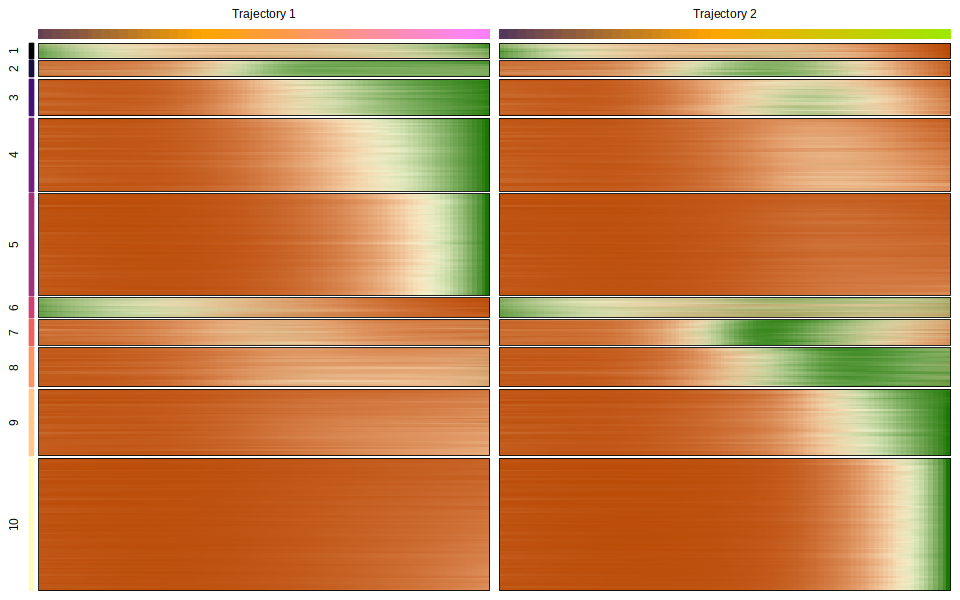

In [54]:
# Clustering

hm_list = Heatmap(Alnt, 
            row_gap = unit(0.5, "mm"),
            cluster_columns = FALSE,
            column_title = 'Trajectory 1',
            show_column_names  = FALSE,
            show_row_names  = FALSE,
            col = trans,
            show_heatmap_legend = FALSE,
            row_split = group, 
            left_annotation = ha_row,
            show_row_dend = FALSE,
            row_order = order(group, decreasing = TRUE),
            # heatmap_legend_param = list(title = 'Expression'), 
            row_title_gp = gpar(fontsize = 7),
            column_title_gp = gpar(fontsize = 7),
            top_annotation = ha_alnt,
            border = TRUE,
            border_gp = gpar(col = "black", lwd = 0.5),
            use_raster = TRUE,
            raster_device = "png",
            raster_quality = 1) + 
          Heatmap(YS, 
            row_gap = unit(0.5, "mm"),
            cluster_columns = FALSE,
            column_title = 'Trajectory 2',
            show_column_names  = FALSE,
            show_row_names  = FALSE,
            col = trans,
            show_heatmap_legend = FALSE,
            row_split = group, 
            left_annotation = NULL,
            show_row_dend = FALSE,
            row_order = order(group, decreasing = TRUE),
            column_title_gp = gpar(fontsize = 7),
            top_annotation = ha_ys,
            border = TRUE,
            border_gp = gpar(col = "black", lwd = 0.5),
            use_raster = TRUE,
            raster_device = "png",
            raster_quality = 1)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [55]:
pdf(file = file.path(io$basedir, 'figures/multiome_trajectory_ATAC_heatmap.pdf'),
   height = 2.3, 
   width = 1.7)
    draw(hm_list)
dev.off()

png 
  2

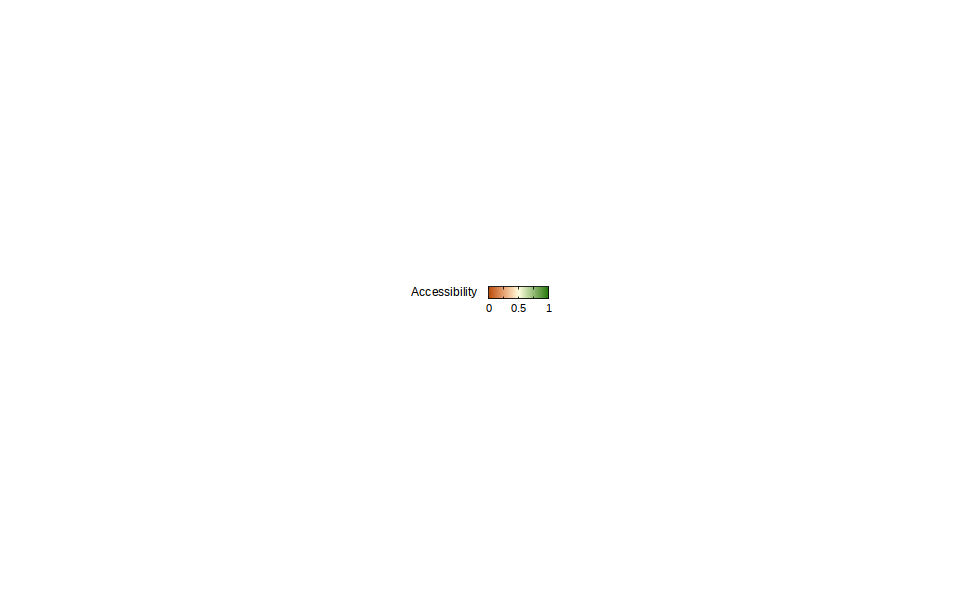

In [542]:
heatmap_legend = ggplot(data.table(x = c(0:1)), aes('a', 'b', color = x)) + 
    geom_point() + 
    guides(colour = guide_colourbar(
         barwidth = 2.5, barheight = 0.5,
        frame.colour = "black", 
        ticks.colour = "black"
    )) + 

    scale_color_gradient2(low='#ba4a04', mid='lightyellow', high='#1a7800', midpoint = 0.5, name = 'Accessibility', breaks = c(0, 0.25, 0.5, 0.75, 1), labels = c(0, '', 0.5, '', 1)) + 
    theme_bw() + 
    theme(legend.position = 'bottom', 
          legend.title = element_text(size = 7, vjust = 1),
          legend.text = element_text(size = 6),
          legend.margin=margin(0,0,0,0))

celltype_legend = as_ggplot(get_legend(heatmap_legend))

celltype_legend
ggsave(file.path(io$basedir, 'figures/multiome_trajectory_ATAC_heatmap_legend.pdf'), 
       plot = celltype_legend,
       width = 90, 
       height = 8, 
       units = "mm")

### Cluster motif enrichment

In [58]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
cisbp_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(cisbp_silico_chip, 'matches') = assay(cisbp_silico_chip, 'VirtualChipScores') > 0.20
assay(cisbp_silico_chip, 'motifScores') = NULL
assay(cisbp_silico_chip, 'motifMatches') = NULL
assay(cisbp_silico_chip, 'motifCounts') = NULL
assay(cisbp_silico_chip, 'VirtualChipScores') = NULL
matches = cisbp_silico_chip

In [59]:
clust_enrichment = lapply(unique(group), function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, names(group[group == x]), seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[,group := factor(x, levels = group_levels)]
    return(tmp)
}) %>% rbindlist()

In [62]:
yhatSmooth <- predictSmooth(sceGAM, gene = rownames(sceGAM), nPoints = 100, tidy=TRUE)

group_levels = 1:10
smooth.dt = as.data.table(yhatSmooth, keep.rownames=F) %>% 
    .[,yhat := minmax(yhat), by='gene'] %>% 
    .[,trajectory := ifelse(lineage == '1', 'Trajectory1', 'Trajectory2')] %>%
    .[,trajectory := factor(trajectory, levels=c('Trajectory1', 'Trajectory2'))] %>% 
    merge(., 
          as.data.table(group, keep.rownames=T) %>% setnames('rn', 'gene'),
          by='gene') %>%
    setnames(c('yhat', 'time'), c('MinMax_Expr', 'pseudotime')) %>%
    .[,group := factor(group, levels = group_levels)]

mean.dt = smooth.dt %>% copy() %>% 
    .[,MinMax_Expr := mean(MinMax_Expr), by=c('group', 'trajectory', 'pseudotime')] %>% 
    unique(by=c('group', 'trajectory', 'pseudotime'))

nrow(smooth.dt)
nrow(mean.dt)

options(repr.plot.height=4, repr.plot.width=7)

p1 = ggplot(smooth.dt, aes(pseudotime, MinMax_Expr, col=trajectory, group.by=gene)) + 
    geom_line(alpha=0.05, size=0.03) +
    geom_line(data=mean.dt, size=1) + 
    scale_color_manual(values=c(Trajectory1='chartreuse4', Trajectory2='darkorchid4'), name='Trajectory') + 
 #   scale_color_manual(values=c('YS_traj' = 'black', 'Allantois_Traj' = 'red'), name='Trajectory') + 
    scale_x_continuous(expand=c(0.01,0, 0, 0), breaks=c(seq(2, 13, 3))) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0), breaks = c(0,1), labels = c('Min', 'Max')) + 
    facet_wrap(~group, nrow=2) + 
    ggtitle('Differential Peaks') + 
    ylab('Accessibility') + 
    theme_bw() + 
    theme(strip.background=element_blank(),
            strip.text = element_text(size=14),
            axis.title = element_text(size=14, color='black'),
            axis.text = element_text(color='black', size = 12), 
            plot.title = element_text(color = 'black', size = 16, hjust = 0.5, vjust = -2),
            legend.position = 'none')

[1] 2044200

[1] 2000

In [63]:
options(repr.plot.height=7, repr.plot.width=15)
to.plot = as.data.table(clust_enrichment) %>% 
    .[,rank := seq_len(.N), by=group] %>% 
    .[mlog10Padj > -log10(0.05)]
p2 = ggplot(to.plot, aes(rank, mlog10Padj, color=Enrichment)) + 
    geom_point() +
    ggrepel::geom_text_repel(data = to.plot[, head(.SD, 7), by='group'], aes(label = feature),
                             box.padding = 0.1,
                           #  nudge_x = 4,
                            direction = "y",
                            vjust = .5,
                            hjust =-0.5,
                             size = 5,
                             color='black'
                            ) + 
    scale_x_continuous(expand=c(0.05,0, 0, 0)) + 
    scale_y_continuous(expand=c(0,0, 0.05, 0)) + 
    facet_wrap(~group, ncol=4, scales='free') + 
    theme_bw() + 
    theme(strip.background = element_blank(),
          text = element_text(size=20),
          strip.text = element_text(size=20), 
          panel.border = element_rect(linewidth=1.2),
          axis.text = element_text(color='black'),
          legend.position = 'none')

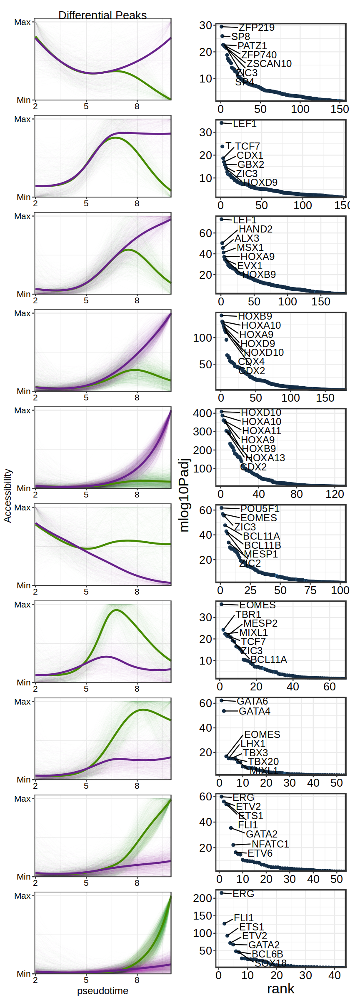

In [64]:
options(repr.plot.height=20, repr.plot.width=7)

ggarrange(
    p1+   facet_wrap(~group, ncol=1, scales='free') + theme(legend.position = 'none', strip.text = element_blank()),
    p2+   facet_wrap(~group, ncol=1, scales='free') + ggtitle('') + theme(strip.text = element_blank())
)


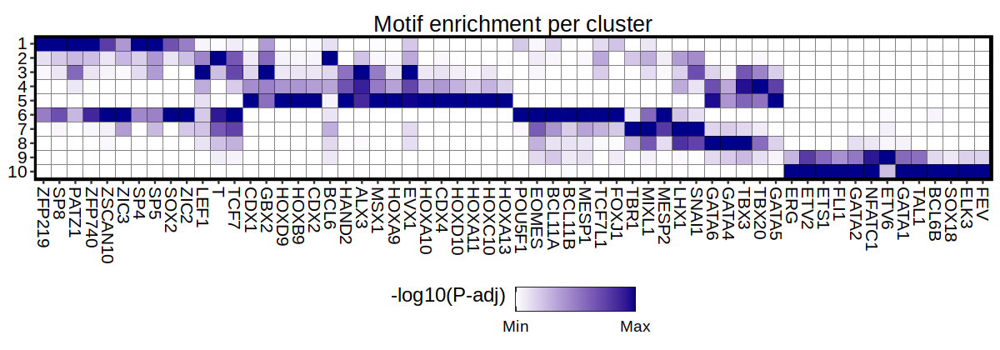

In [65]:
options(repr.plot.height=3.5, repr.plot.width=10)
to.plot = as.data.table(clust_enrichment) %>% 
    .[,rank := seq_len(.N), by=group] %>% 
    .[,value := minmax(mlog10Padj), by=feature] %>% 
    # .[,value := minmax(mlog10Padj)] %>% 
    .[,group := factor(group, levels = rev(group_levels))] %>% 
    .[order(-group)]

features = to.plot[, head(.SD, 10), by='group'][mlog10Padj > -log10(0.05)]$feature
ggplot(to.plot[feature %in% features][, feature := factor(feature, levels = unique(features))], aes(feature, group, fill=value)) + 
        geom_tile(col='black') +
        scale_fill_gradient(low='white', high='darkblue', name='-log10(P-adj)', breaks = c(0,1), labels = c('Min', 'Max')) +
        guides(fill = guide_colourbar(
            # barwidth = 1, barheight = 1,
            frame.colour = "black", 
            ticks.colour = "black"
        )) + 
        ggtitle('Motif enrichment per cluster') + 
        theme(text=element_text(size=14), 
                             axis.text = element_text(color='black'),
                             axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=12), 
                             axis.text.y=element_text(hjust=1, size = 12),
                             legend.position='bottom',
                             legend.title = element_text(vjust = 1),
                             axis.title = element_blank(),
                             panel.border = element_rect(color='black', linewidth=1.5, fill=NA),
                             panel.background = element_blank(),
                             plot.title = element_text(color = 'black', size = 16, hjust = 0.5, vjust = -1),
                             axis.line = element_blank())

In [79]:
args$outdir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna_atac/trajectory/v3"

In [78]:
# write bed & perform HOMER
dir.create(sprintf('%s/clusters_homer/', args$outdir), recursive=TRUE, showWarnings =FALSE)
mclapply(unique(group), function(x){
    tmp = as.data.table(names(group[group == x])) %>% setnames('peak') %>% 
        .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
            .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
            .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
        .[,c('chr', 'start', 'end')]

    fwrite(tmp, sprintf('%s/clusters_homer/cluster_%s.bed', args$outdir, x) , col.names=F, sep='\t')
})

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

In [81]:
# Motif search using Homer
mclapply(unique(group), function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/clusters_homer/cluster_%s.bed mm10 %s/clusters_homer/cluster_%s/ -size 75 -S 10 -len 8,10,12 -p 24', 
                       args$outdir, x,
                         args$outdir, x)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

[[3]]
[1] 0

[[4]]
[1] 0

[[5]]
[1] 0

[[6]]
[1] 0

[[7]]
[1] 0

[[8]]
[1] 0

[[9]]
[1] 0

[[10]]
[1] 0

# Old

In [51]:
peak_gene_correlation = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))[peak %in% genes_keep]

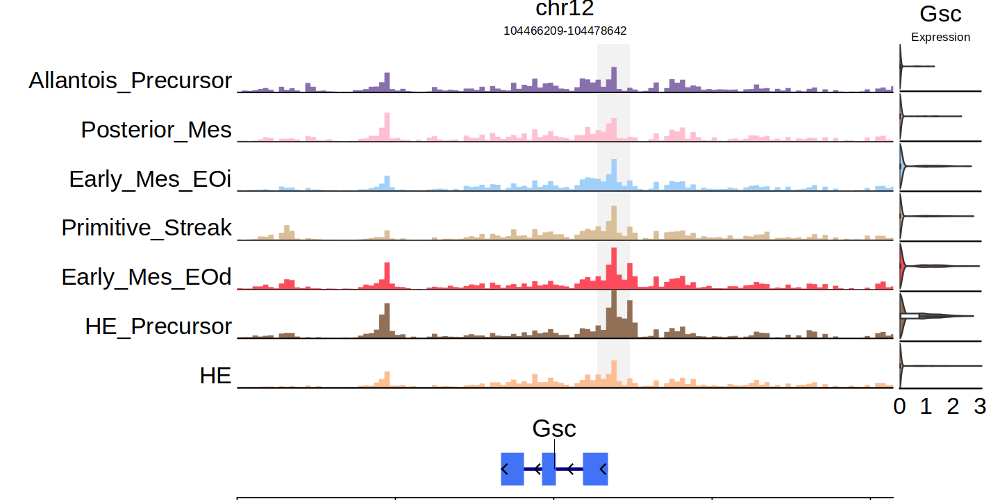

In [53]:
# Plot gene with peaks
input_gene = 'Gsc'

tmp1 = peak_gene_correlation[gene %in% c(input_gene)][padj < 0.05]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 5e3,
                              extend.downstream = 5e3, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = 'grey95',
                              bw_height = 1.5, 
                              gene_height = 2.5,
                              bw_width = 20)

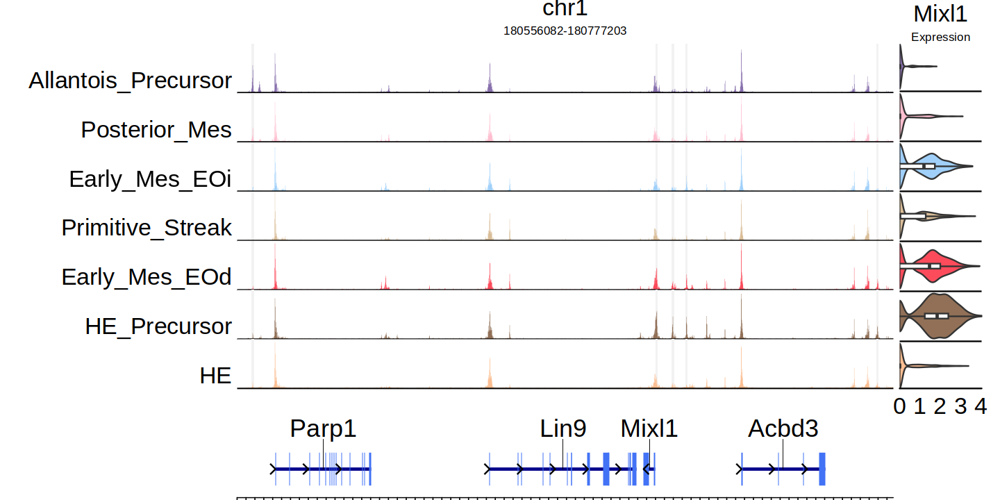

In [54]:
# Plot gene with peaks
input_gene = 'Mixl1'

tmp1 = peak_gene_correlation[gene %in% c(input_gene)][padj < 1]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 5e3,
                              extend.downstream = 5e3, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = 'grey95',
                              bw_height = 1.5, 
                              gene_height = 2.5,
                              bw_width = 20)

In [55]:
map2color<-function(x,pal,limits=NULL){
    if(is.null(limits)) limits=range(x)
    pal[findInterval(x,seq(limits[1],limits[2],length.out=length(pal)+1), all.inside=TRUE)]
}

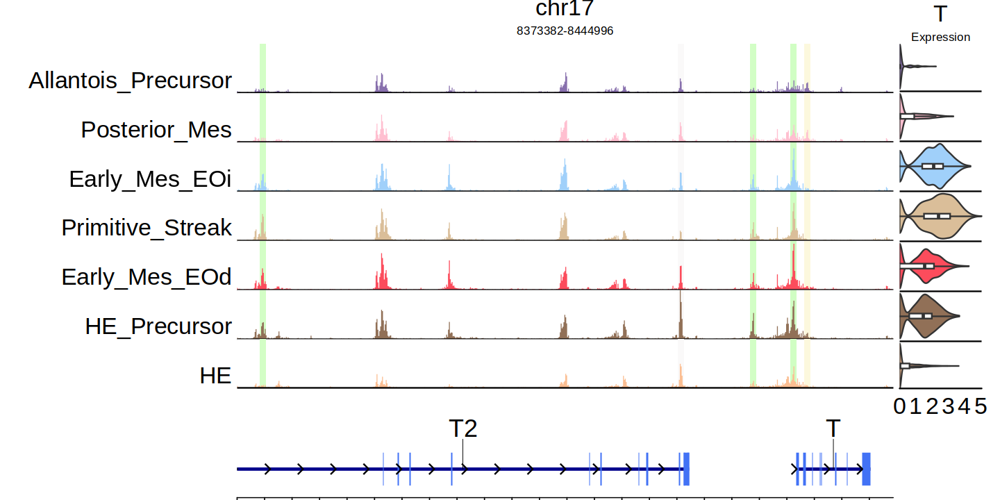

In [56]:
# Plot gene with peaks
input_gene = 'T'

tmp1 = peak_gene_correlation[gene %in% c(input_gene)][padj < 1]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff7b8","grey98","#d0ffc2"))(100)
x <- peak_gene_correlation[gene %in% input_gene, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(peak_gene_correlation[gene %in% input_gene, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 2.5e3,
                              extend.downstream = 2.5e3, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 1.5, 
                              gene_height = 2.5,
                              bw_width = 20)

In [63]:
head(tmp1)

peak,cor,pval,distance,gene,padj
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
chr7:30527778-30528378,0.743,0.0000755158,105538,Etv2,0.0008297313
chr7:30532898-30533498,0.603,0.0029520350,100418,Etv2,0.0136712209
chr7:30552092-30552692,-0.518,0.0134900946,81224,Etv2,0.0441982526
chr7:30553050-30553650,-0.690,0.0003805773,80266,Etv2,0.0028546738
chr7:30586473-30587073,-0.640,0.0013371546,46843,Etv2,0.0074964166
chr7:30607779-30608379,-0.581,0.0045620859,25537,Etv2,0.0192055858


In [66]:
highlight_colors

30638958  30760088  30785602      <NA>      <NA>      <NA>      <NA>      <NA> 
"#DAFDCF" "#E0FDD7" "#FCF8D8" "#FDF7CC" "#FDF8D0" "#FCF8D2" "#FDF7CD" "#DFFDD6" 
     <NA>      <NA>      <NA>      <NA>      <NA>      <NA>      <NA>      <NA> 
"#D9FDCE" "#FCF8D2" "#FDF8D0" "#E0FCD8" "#DCFDD2" "#FDF8D1" "#DEFDD5" "#FDF7CD" 
     <NA>      <NA>      <NA>      <NA>      <NA> 
"#FCF8D6" "#DDFDD4" "#D5FEC8" "#D5FEC9" "#E3FCDC"

In [67]:
x

[1]  0.743  0.603 -0.518 -0.690 -0.640 -0.581 -0.673  0.622  0.775 -0.596
[11] -0.634  0.585  0.699 -0.619  0.641 -0.674 -0.537  0.678  0.870  0.852
[21]  0.528

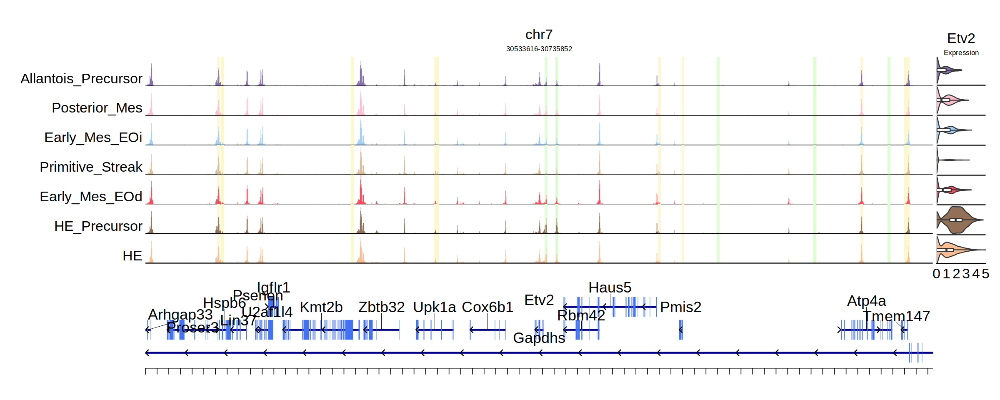

In [68]:
# Plot gene with peaks
input_gene = 'Etv2'
peak_gene_correlation_all = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))
tmp1 = peak_gene_correlation_all[gene %in% c(input_gene)][padj < 0.05]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff7b8","grey98","#d0ffc2"))(100)
x <- tmp1[, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(tmp1[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=8, repr.plot.width=20)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = NULL, 
                              bigwigs = WT_plot, 
                              extend.upstream = 1e5,
                              extend.downstream = 1e5, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 1.5, 
                              gene_height = 4.5,
                              bw_width = 40)

In [69]:
unique(bigwigs.data_vitro$name)

[1] "Allantois_Precursor-KO" "Allantois_Precursor-WT" "Allantois-KO"          
 [4] "Allantois-WT"           "Blood_Progenitor-WT"    "Early_Mes_EOd-KO"      
 [7] "Early_Mes_EOd-WT"       "Early_Mes_EOi-KO"       "Early_Mes_EOi-WT"      
[10] "Endothelium-KO"         "Endothelium-WT"         "HE_Precursor-KO"       
[13] "HE_Precursor-WT"        "HE-KO"                  "HE-WT"                 
[16] "Mesenchyme-KO"          "Mesenchyme-WT"          "PGC-KO"                
[19] "PGC-WT"                 "Posterior_Mes-KO"       "Posterior_Mes-WT"      
[22] "Primitive_Streak-KO"    "Primitive_Streak-WT"

In [72]:
bigwig_order = c('Early_Mes_EOd-KO','Early_Mes_EOd-WT',
                    'Primitive_Streak-KO','Primitive_Streak-WT',
                'Early_Mes_EOi-KO','Early_Mes_EOi-WT')
WT_plot = bigwigs.data_vitro %>% copy() %>%
    .[genotype %in% c('WT', 'KO')] %>% 
   # .[, name := ifelse(genotype=='WT', celltype, name)] %>% 
    #.[, color := ifelse(genotype=='WT', opts$celltype_v2.colors[celltype], color)] %>% 
    .[match(bigwig_order, name)] %>% 
    .[, name := factor(name, levels = bigwig_order)]

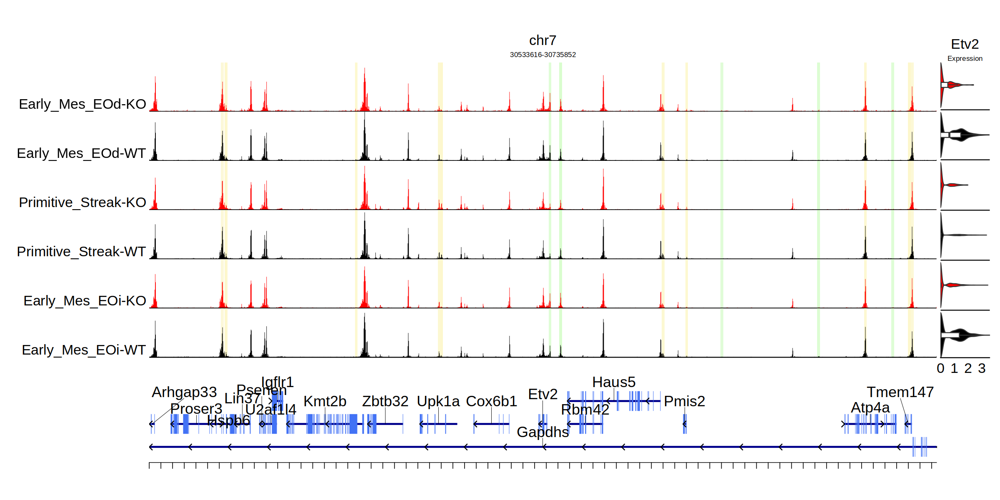

In [74]:
# Plot gene with peaks
input_gene = 'Etv2'
peak_gene_correlation_all = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))
tmp1 = peak_gene_correlation_all[gene %in% c(input_gene)][padj < 0.05]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff7b8","grey98","#d0ffc2"))(100)
x <- tmp1[, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(tmp1[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=10, repr.plot.width=20)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = NULL, 
                              bigwigs = WT_plot, 
                              extend.upstream = 1e5,
                              extend.downstream = 1e5, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 2.5, 
                              gene_height = 4.5,
                              bw_width = 40)

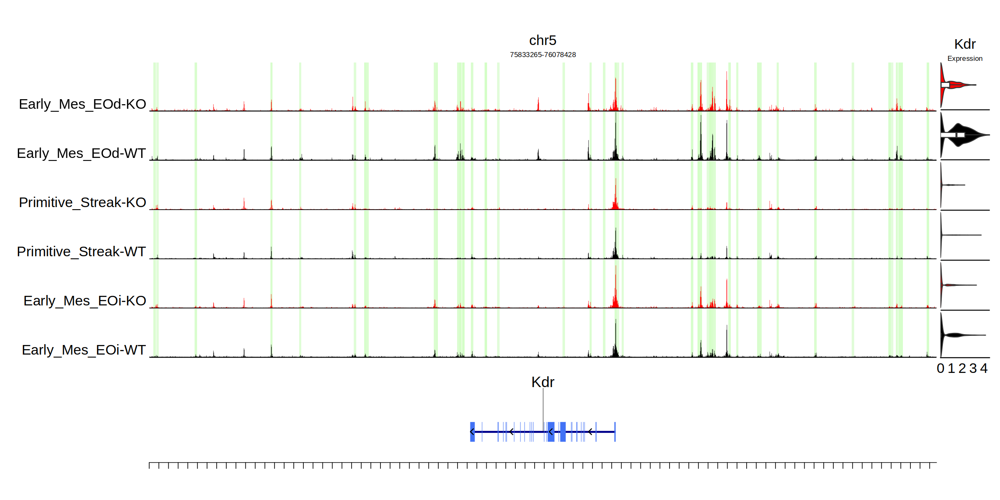

In [75]:
# Plot gene with peaks
input_gene = 'Kdr'
peak_gene_correlation_all = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))
tmp1 = peak_gene_correlation_all[gene %in% c(input_gene)][padj < 0.05]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff7b8","grey98","#d0ffc2"))(100)
x <- tmp1[, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(tmp1[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=10, repr.plot.width=20)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = NULL, 
                              bigwigs = WT_plot, 
                              extend.upstream = 1e5,
                              extend.downstream = 1e5, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 2.5, 
                              gene_height = 4.5,
                              bw_width = 40)

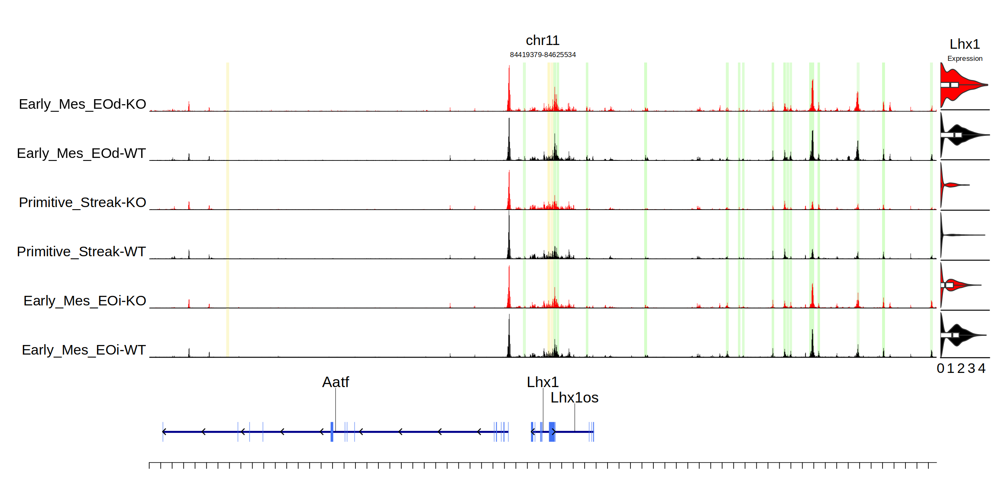

In [77]:
# Plot gene with peaks
input_gene = 'Lhx1'
peak_gene_correlation_all = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))
tmp1 = peak_gene_correlation_all[gene %in% c(input_gene)][padj < 0.05]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff7b8","grey98","#d0ffc2"))(100)
x <- tmp1[, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(tmp1[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=10, repr.plot.width=20)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = NULL, 
                              bigwigs = WT_plot, 
                              extend.upstream = 1e5,
                              extend.downstream = 1e5, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 2.5, 
                              gene_height = 4.5,
                              bw_width = 40)

In [544]:
patternRes <- patternTest(sceGAM, l2fc=0) # Perform pattern testing with set l2fc
patternGenes = patternRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(patternGenes[sig==TRUE])

[1] 11943

In [545]:
endRes <- diffEndTest(sceGAM, l2fc=0) # Perform pattern testing with set l2fc
endGenes = endRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>% # rename gene column
    .[waldStat != 0] %>% # Before multiple testing comparison, remove genes that do not qualify according to l2fc
    .[,padj:= p.adjust(pvalue, "fdr")] %>% # Multiple testing comparison
    .[,sig:=ifelse(padj<=0.05, TRUE, FALSE)] # Set significance
nrow(endGenes[sig==TRUE])

[1] 12507

In [546]:
genes_keep = unique(rbind(patternGenes[,c('gene', 'waldStat', 'padj', 'sig')], endGenes[,c('gene', 'waldStat', 'padj', 'sig')])[sig==TRUE][order(padj, -waldStat)]$gene)
length(genes_keep)

[1] 16275

In [449]:
peak_gene_correlation = fread(file.path(args$outdir, 'acc_gene_correlation.txt.gz'))[peak %in% genes_keep]

In [579]:
peak_gene_correlation[gene %in% c("Pdgfra")][padj < 1]

peak,cor,pval,distance,gene,padj
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>


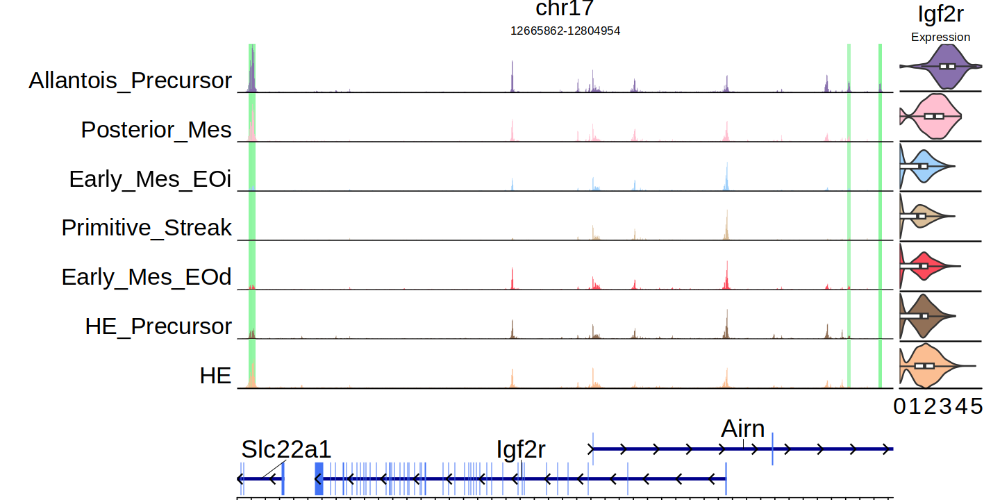

In [582]:
# Plot gene with peaks
input_gene = 'Igf2r'

tmp1 = peak_gene_correlation[gene %in% c(input_gene)][padj < 0.1]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff499","grey96","#7ef794"))(100)
x <- peak_gene_correlation[gene %in% input_gene, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(peak_gene_correlation[gene %in% input_gene, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 2.5e3,
                              extend.downstream = 2.5e3, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 1.5, 
                              gene_height = 2.5,
                              bw_width = 20)

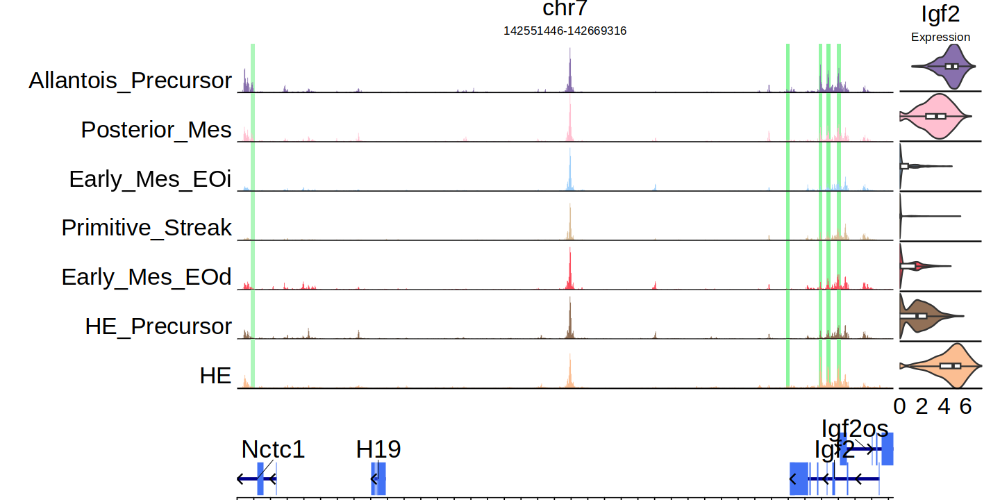

In [583]:
# Plot gene with peaks
input_gene = 'Igf2'

tmp1 = peak_gene_correlation[gene %in% c(input_gene)][padj < 0.1]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff499","grey96","#7ef794"))(100)
x <- peak_gene_correlation[gene %in% input_gene, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(peak_gene_correlation[gene %in% input_gene, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 2.5e3,
                              extend.downstream = 2.5e3, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 1.5, 
                              gene_height = 2.5,
                              bw_width = 20)

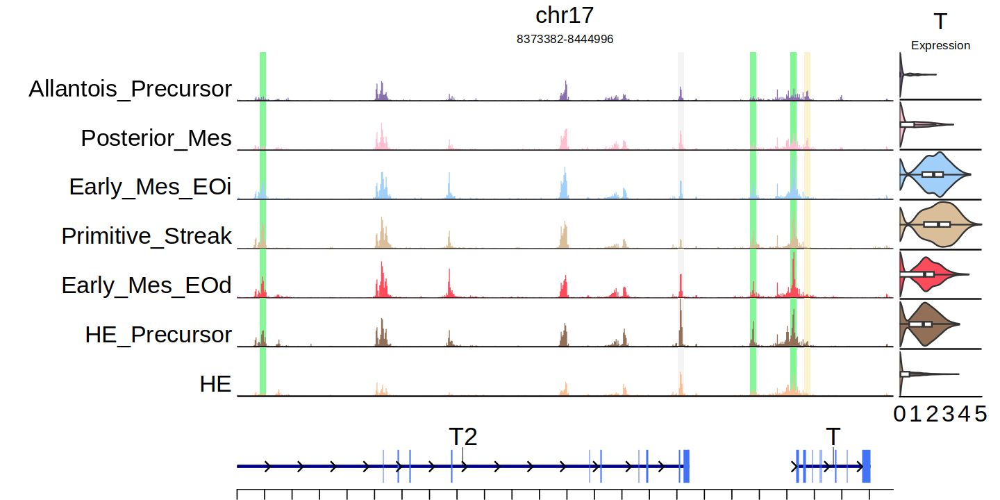

In [614]:
# Plot gene with peaks
input_gene = 'T'

tmp1 = peak_gene_correlation[gene %in% c(input_gene)][padj < 1]
gene_region = ArchRProject@geneAnnotation$genes[grep(paste0('^', input_gene, '$'), ArchRProject@geneAnnotation$genes$symbol)]
peak_regions = as.numeric(str_split(str_split(tmp1$peak, ':') %>% map_chr(2), '-') %>% map_chr(1))
start = min(c(start(ranges(gene_region)), peak_regions))
end = max(c(c(end(ranges(gene_region)), peak_regions + 600)))
input_region = paste0(gene_region@seqnames@values, ':', start, '-', end)

mypal <- colorRampPalette(c("#fff499","grey96","#7ef794"))(100)
x <- peak_gene_correlation[gene %in% input_gene, cor]
highlight_colors = map2color(x,mypal, limits = c(-1,1))
names(highlight_colors) = str_split(str_split(peak_gene_correlation[gene %in% input_gene, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)

options(repr.plot.height=6, repr.plot.width=12)
plot_browser_track(gene = input_gene, # Only choose one of gene/input_region, otherwise will use region
                              input_region = input_region, 
                              bigwigs = WT_plot, 
                              extend.upstream = 2.5e3,
                              extend.downstream = 2.5e3, 
                              highlight_regions = tmp1$peak,
                              downsample.rate = 1, 
                              no_label = F, 
                              plot_expression = T,
                              background_color = 'white',
                              highlight_color = highlight_colors,
                              bw_height = 1.5, 
                              gene_height = 2,
                              bw_width = 20)